In [5]:
import numpy as np
import pandas as pd
import os,sys
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.signal import find_peaks
import pwl_cvr_functions as cvr_func
import copy
import csv

In [6]:
# Define where the PWL txt files is located 
data_dir = '/Users/ghayes/Desktop/EyeBrain_PWL/'

In [7]:
# GLOBAL VARIABLES #

# Set TCD calibration factor (determined from DWL Dopler BoxX manual) and cut-off threshold (erroneous TCD values are set to NaN if below threshold)
TCD_calibration_factor = 202.07 # TCD calibration factor in cm/s/V
TCD_threshold = 0.07*TCD_calibration_factor # TCD threshold in cm/s

window_length_baseline1 = 120 # window length for baseline correction in s
window_length_5co2 = 120 # window length for 5% CO2 challenge in s
window_length_baseline2 = 70 # window length for baseline correction in s

P_oxford = 1012.2 # hPa (Oxford)
mmHg_per_hPa = 0.75006157584566 # mmHg/hPa
P_conversion_perc2mmHg = P_oxford*mmHg_per_hPa/100 # conversion factor from % gas concentration to mmHg

csv_consolidated = 'pwl_outputs/cvr_consolidated.csv'
log_consolidated = 'pwl_outputs/logs_consolidated.csv'
csv_ses01 = 'cvr_ses-01.csv'
log_ses01 = 'logs_ses-01.csv'
csv_ses02 = 'cvr_ses-02.csv'
log_ses02 = 'logs_ses-02.csv'

plotting = True # plotting flag
save_fig = True # save figure flag
save_csv = True # save csv of results flag
save_log = True # save summary of results flag

sub-001_ses-01_dat-20230227_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  183.75 s || 5% CO2:  121.45 s || Baseline 2:  118.15 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 4.499999999995907 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 35.96373052332971 mmHg
end tidal O2 mean: 112.99292783820329 mmHg
Stimulus index: 0.31828302187927066
MCAvmean mean_base: 41.03358657639564 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 42.011219105800826 mmHg
end tidal O2 mean: 124.29390383190571 mmHg
Stimulus index: 0.3379990314136125
MCAvmean mean_5CO2: 50.643537260865074 cm s-1
---------------------


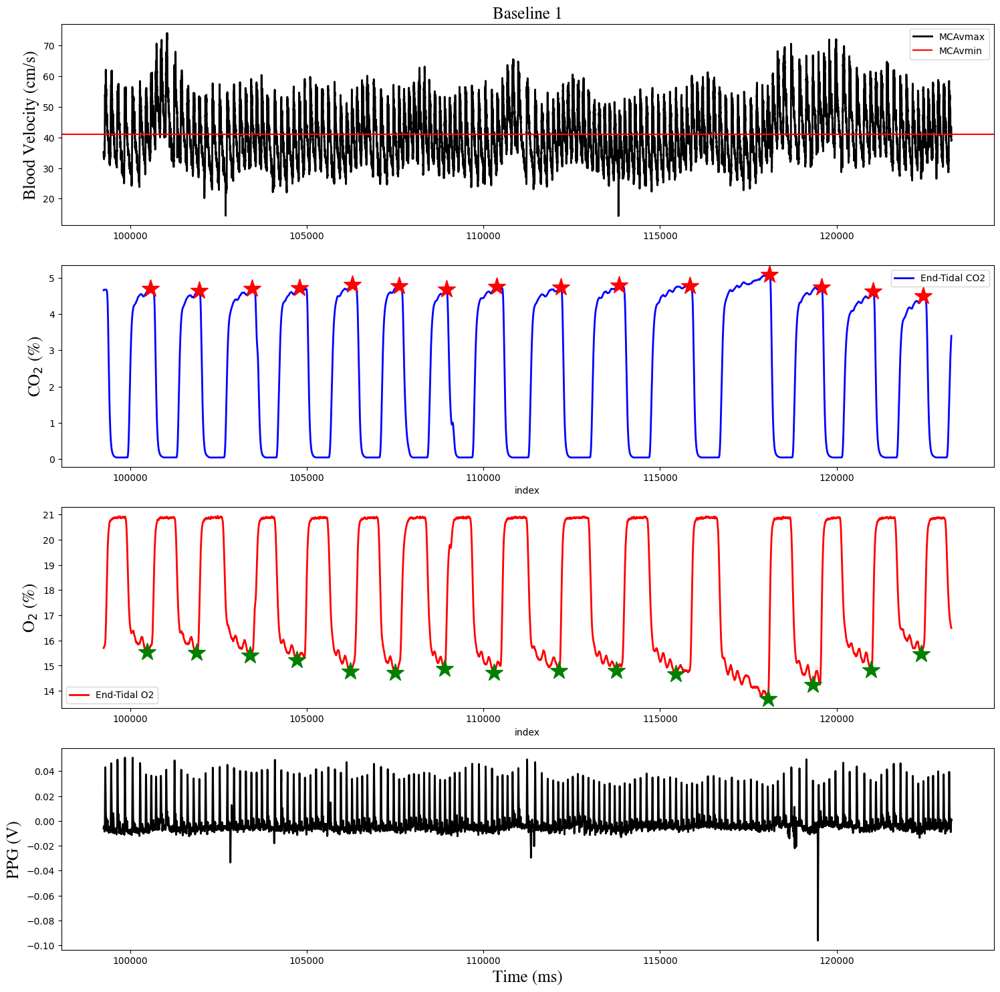

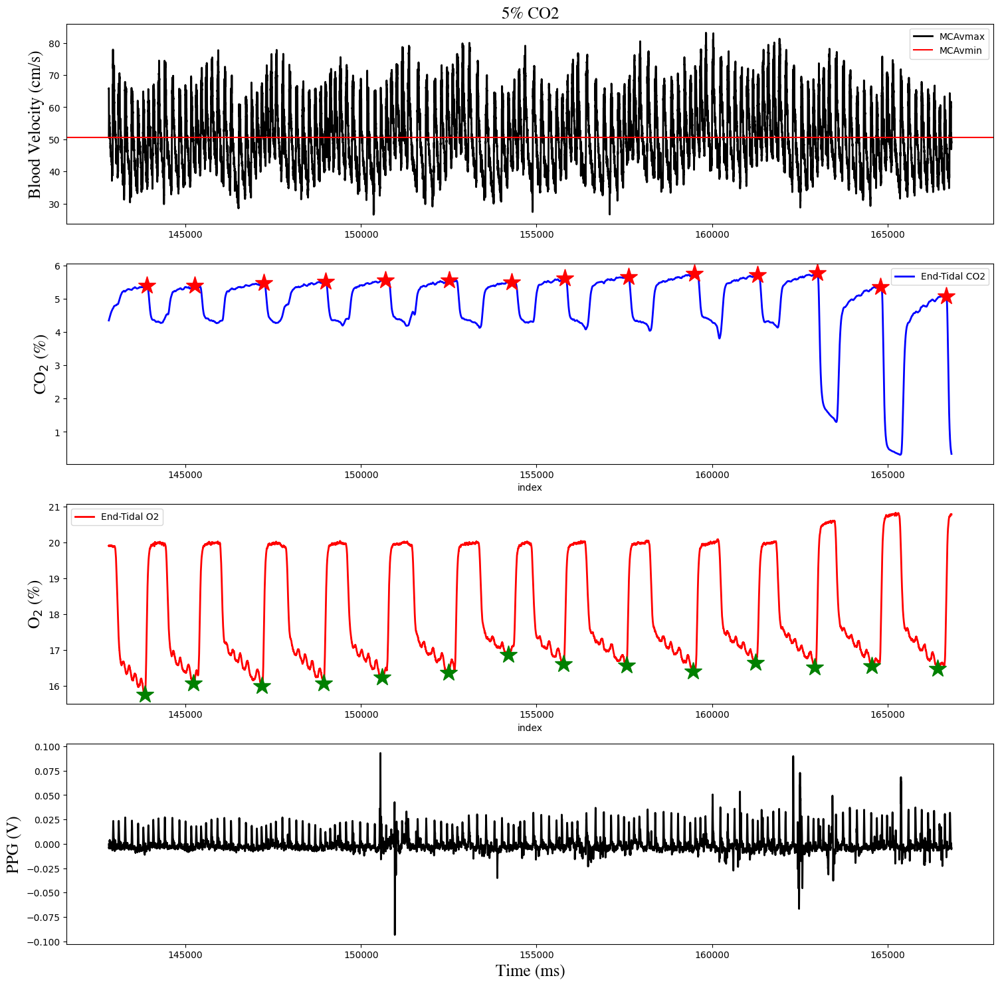

CVR: 3.872635510007516 %/mmHg
CVR_SI: 156.45858925710039 %/mmHg
Percent CVR: 23.419719030842668 %/mmHg


In [8]:
# SUBJECT 1 #
filename = 'sub-001_ses-01_dat-20230227_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 1
O2prominence_base = 1
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-001_ses-02_dat-20230418_task-tcd5co2.txt
---------------------


/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (0,1,2,3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)
/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (0,1,2,3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)


Baseline 1:  182.95 s || 5% CO2:  240.95 s || Baseline 2:  128.35 s
-------After Cropping-------
Baseline 1:  119.99499999999995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 6.545454545448592 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 35.898880722943254 mmHg
end tidal O2 mean: 111.25479495879462 mmHg
Stimulus index: 0.32267266086139573
MCAvmean mean_base: 37.09169066506829 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 43.98470872685889 mmHg
end tidal O2 mean: 113.90340378880516 mmHg
Stimulus index: 0.3861579835525676
MCAvmean mean_5CO2: 50.772642257538664 cm s-1
---------------------


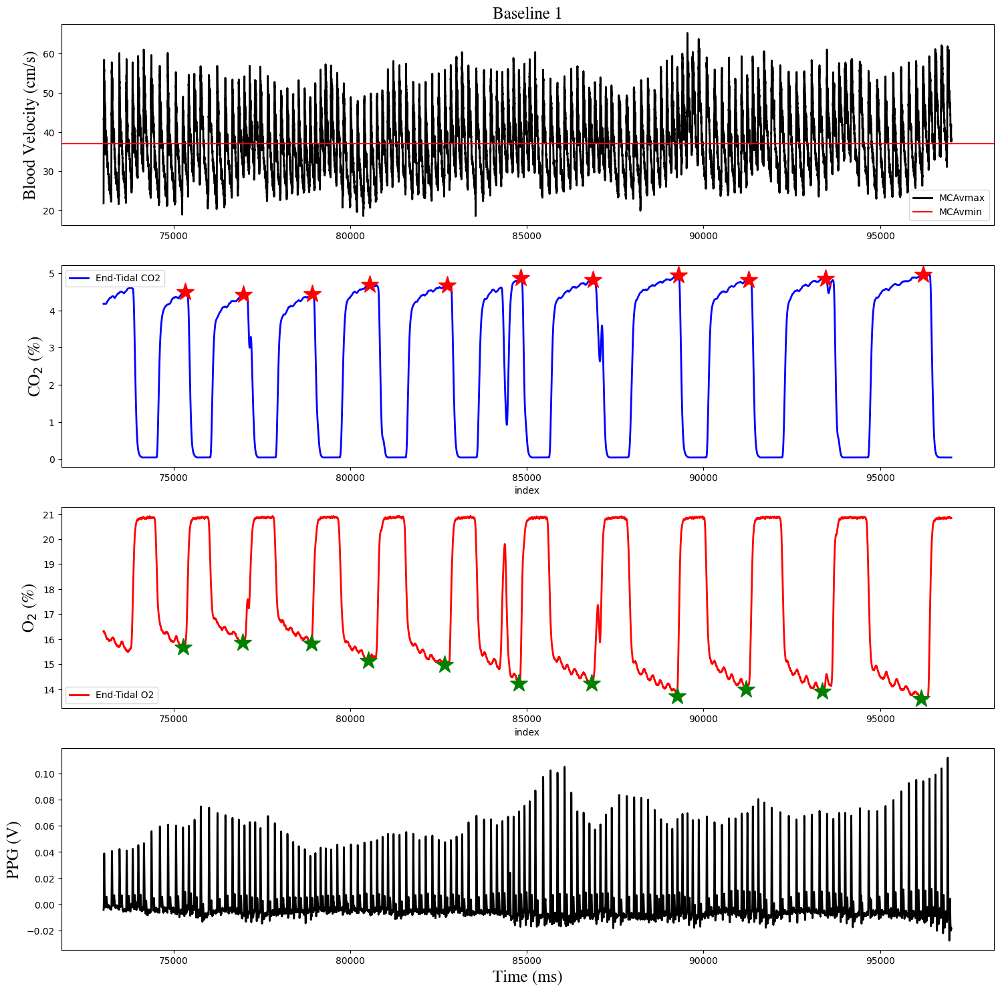

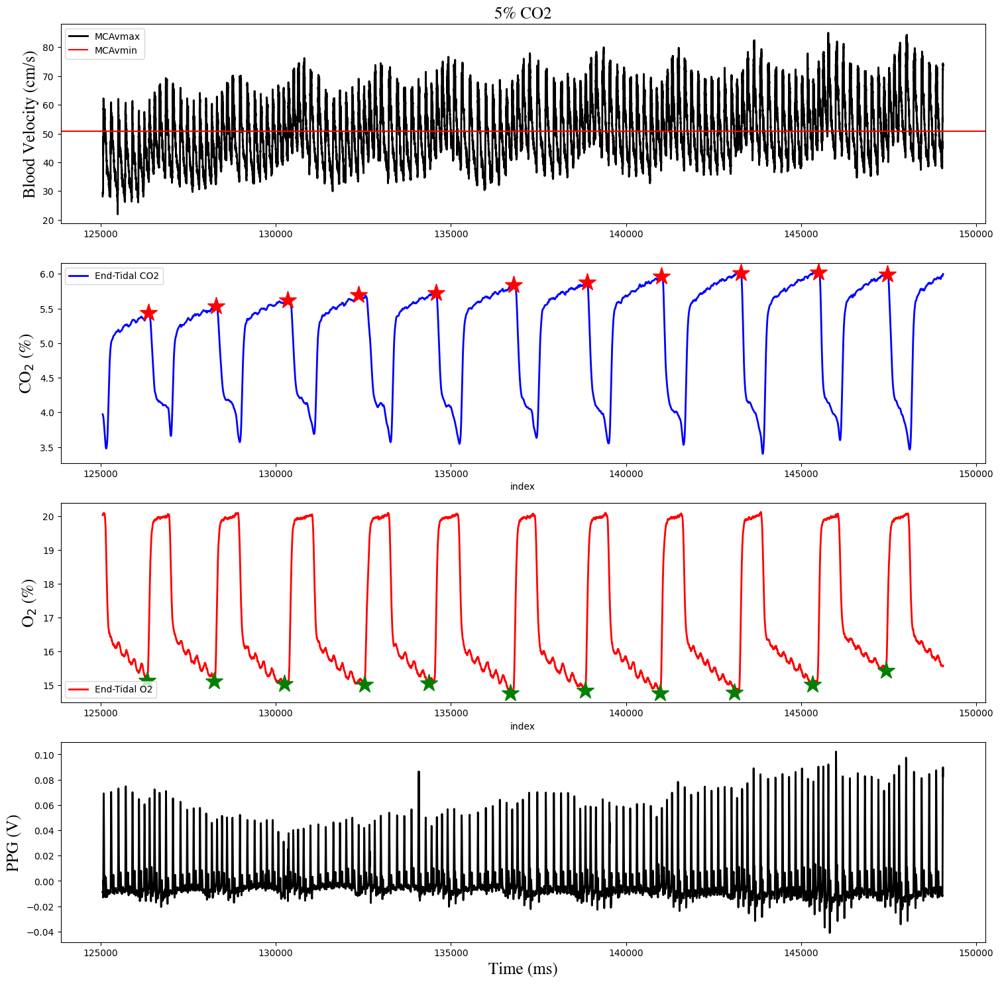

CVR: 4.5615787615159675 %/mmHg
CVR_SI: 76.52495706742735 %/mmHg
Percent CVR: 36.88414129193262 %/mmHg


In [9]:
# SUBJECT 1 SESSION 2 #
filename = 'sub-001_ses-02_dat-20230418_task-tcd5co2.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses02, save_log, log_ses02, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')

sub-002_ses-01_dat-20230210_task-tcd5co2_pwl_200hz.txt
---------------------
Baseline 1:  181.9 s || 5% CO2:  182.95 s || Baseline 2:  182.8 s
-------After Cropping-------
Baseline 1:  119.99500000000003 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 2.666666666664241 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 22.241334967831477 mmHg
end tidal O2 mean: 141.32776694396472 mmHg
Stimulus index: 0.15737413424673993
MCAvmean mean_base: 31.006725440691625 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 32.27877252605993 mmHg
end tidal O2 mean: 143.47110067046754 mmHg
Stimulus index: 0.2249844907804787
MCAvmean mean_5CO2: 40.55607528198345 cm s-1
---------------------


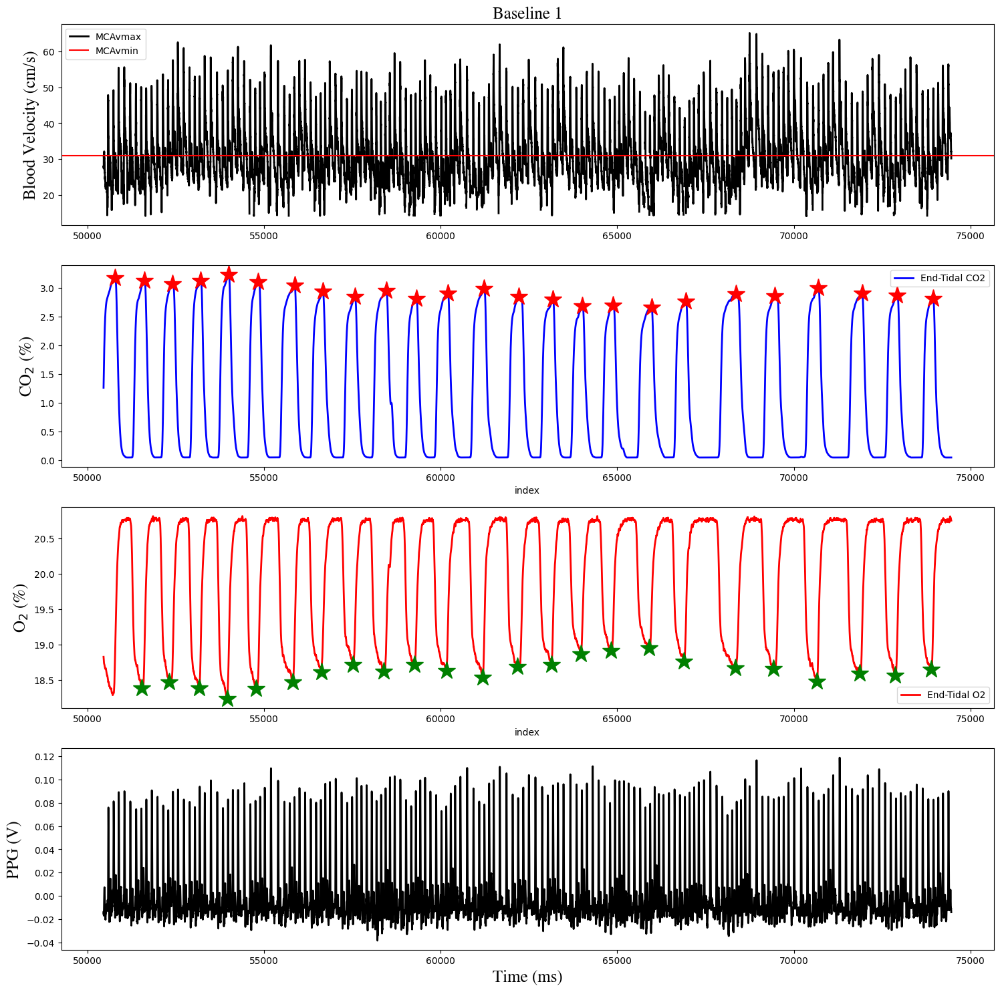

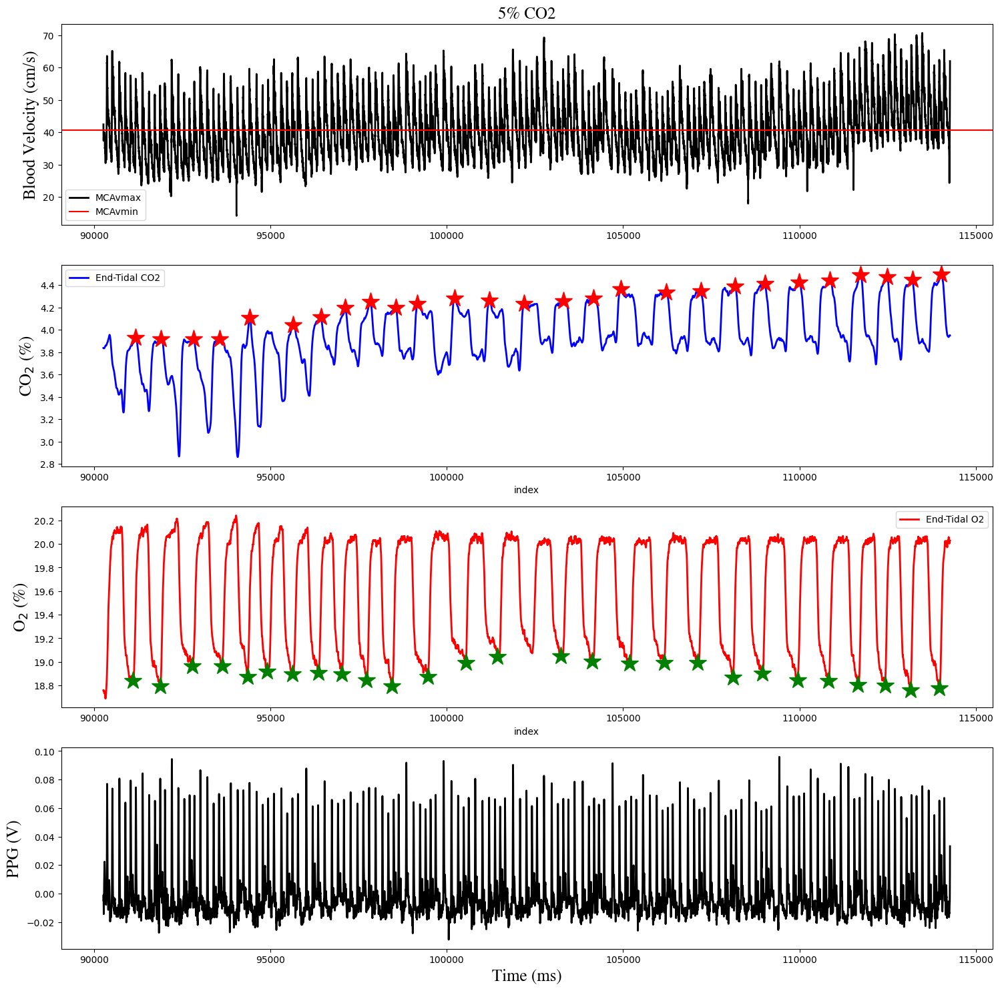

CVR: 3.068280385529117 %/mmHg
CVR_SI: 59.998642350289145 %/mmHg
Percent CVR: 30.797672780885645 %/mmHg


In [10]:
# SUBJECT 2 #
filename = 'sub-002_ses-01_dat-20230210_task-tcd5co2_pwl_200hz.txt'
filepath = data_dir + filename
CO2prominence_base = 1
O2prominence_base = 1
CO2prominence_5co2 = 0.4
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-002_ses-02_dat-20230405_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  190.2 s || 5% CO2:  181.15 s || Baseline 2:  130.9 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.99500000000012 s
Sample rate: 200.0000000001819 Hz || Search window: 2.9999999999972715 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 29.331598847141905 mmHg
end tidal O2 mean: 129.0706596361708 mmHg
Stimulus index: 0.22725225802535534
MCAvmean mean_base: 29.305892557846164 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 40.45860269183229 mmHg
end tidal O2 mean: 132.42521788965288 mmHg
Stimulus index: 0.3055203784942652
MCAvmean mean_5CO2: 40.19744825301461 cm s-1
---------------------


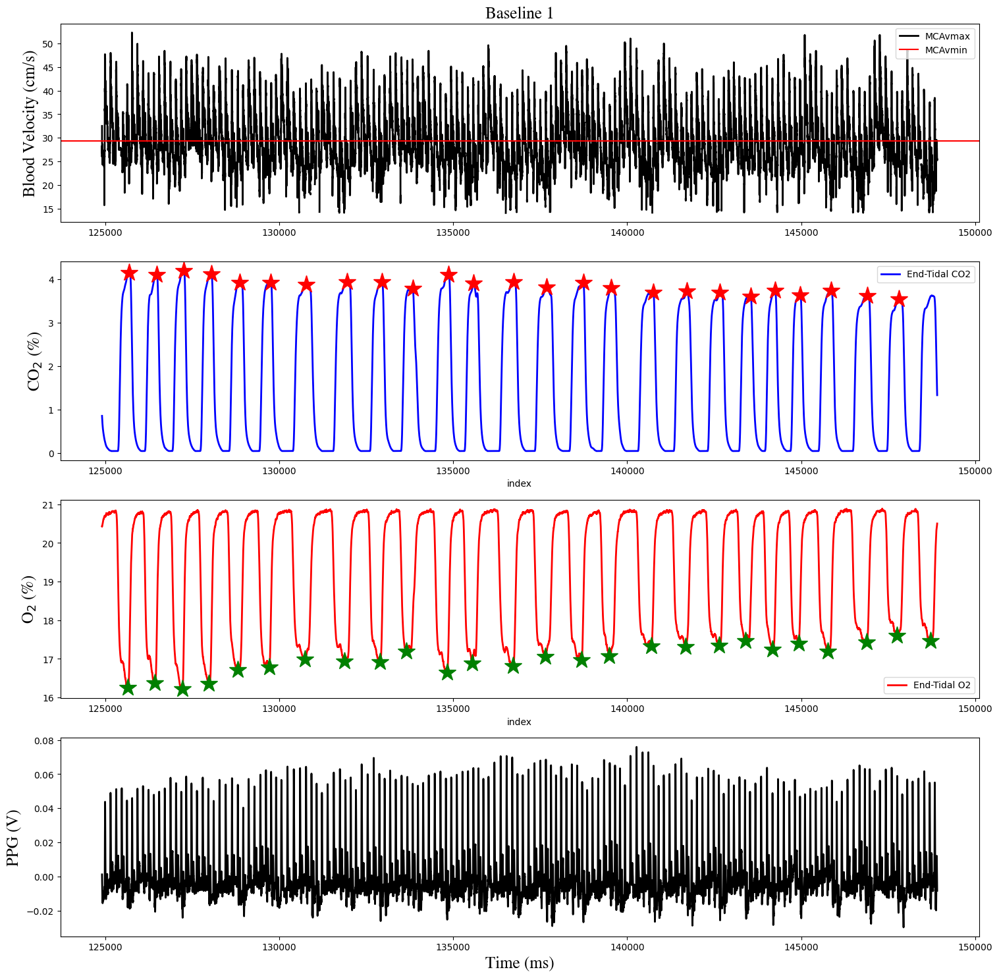

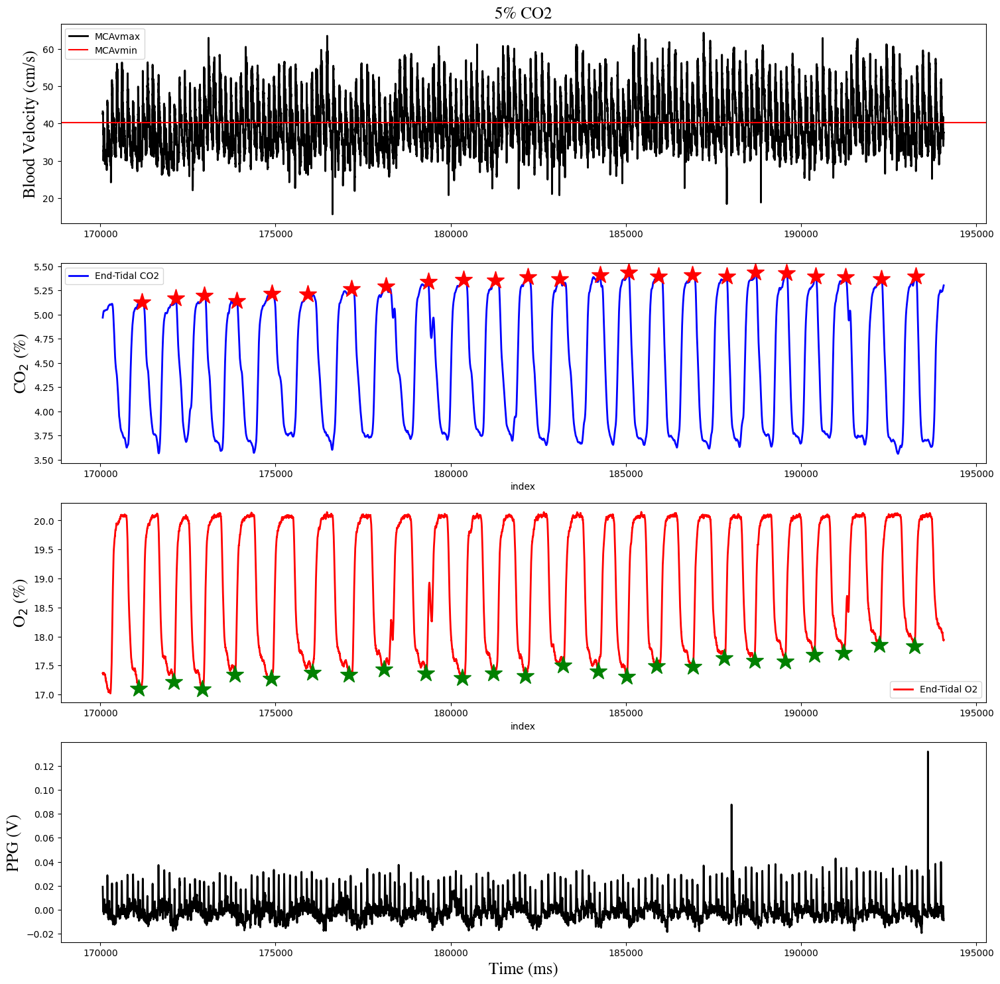

CVR: 3.3400788965185813 %/mmHg
CVR_SI: 62.54416629595545 %/mmHg
Percent CVR: 37.16507072313147 %/mmHg


In [11]:
# SUBJECT 2 SESSION 2 #

filename = 'sub-002_ses-02_dat-20230405_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses02, save_log, log_ses02, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')

sub-003_ses-01_dat-20230209_task-tcd5co2_pwl.txt
---------------------


/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)
/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)


Baseline 1:  229.8 s || 5% CO2:  182.6 s || Baseline 2:  111.05 s
-------After Cropping-------
Baseline 1:  119.99500000000012 s || 5% CO2:  119.99500000000012 s || Baseline 2:  69.99500000000012 s
Sample rate: 200.00000000472937 Hz || Search window: 4.235294117546907 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 31.4685135905548 mmHg
end tidal O2 mean: 123.79460445566671 mmHg
Stimulus index: 0.2541993952719021
MCAvmean mean_base: 36.15256764286468 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 42.07697088917953 mmHg
end tidal O2 mean: 126.22300993318949 mmHg
Stimulus index: 0.3333542031001407
MCAvmean mean_5CO2: 46.597923445479545 cm s-1
---------------------


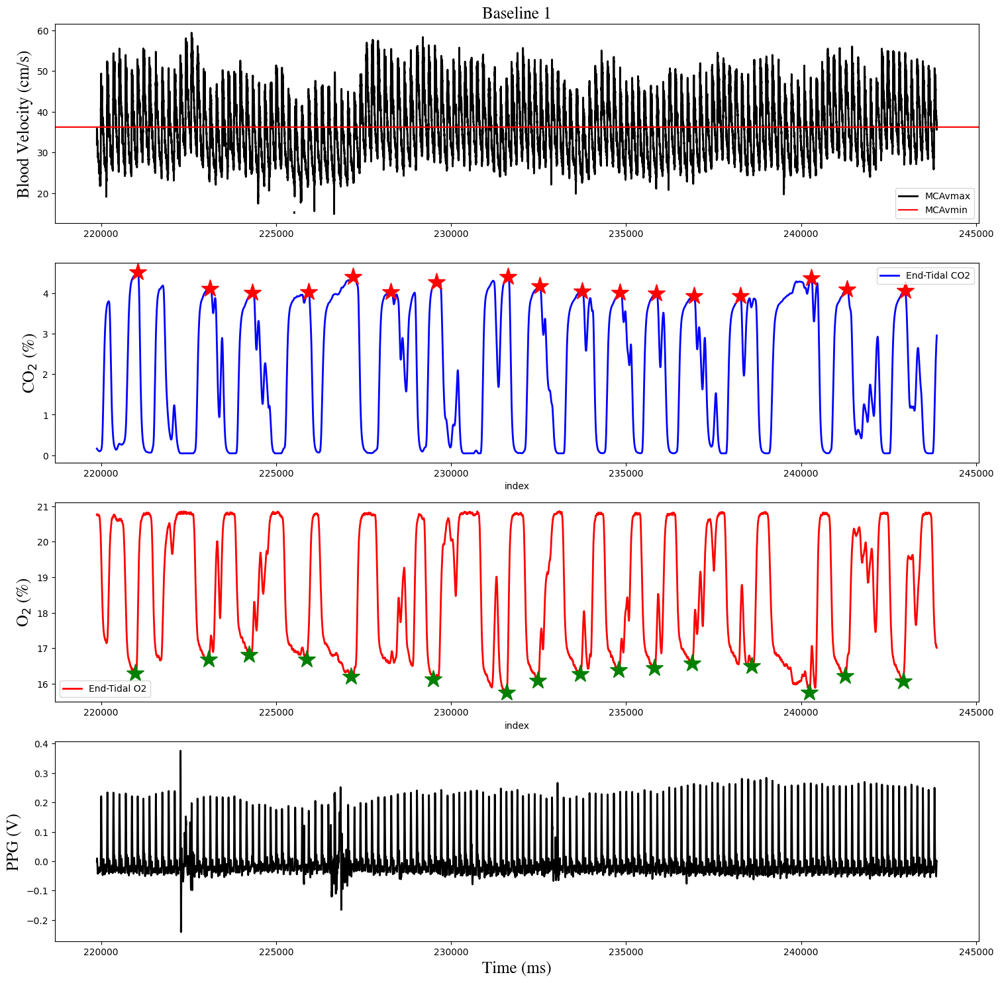

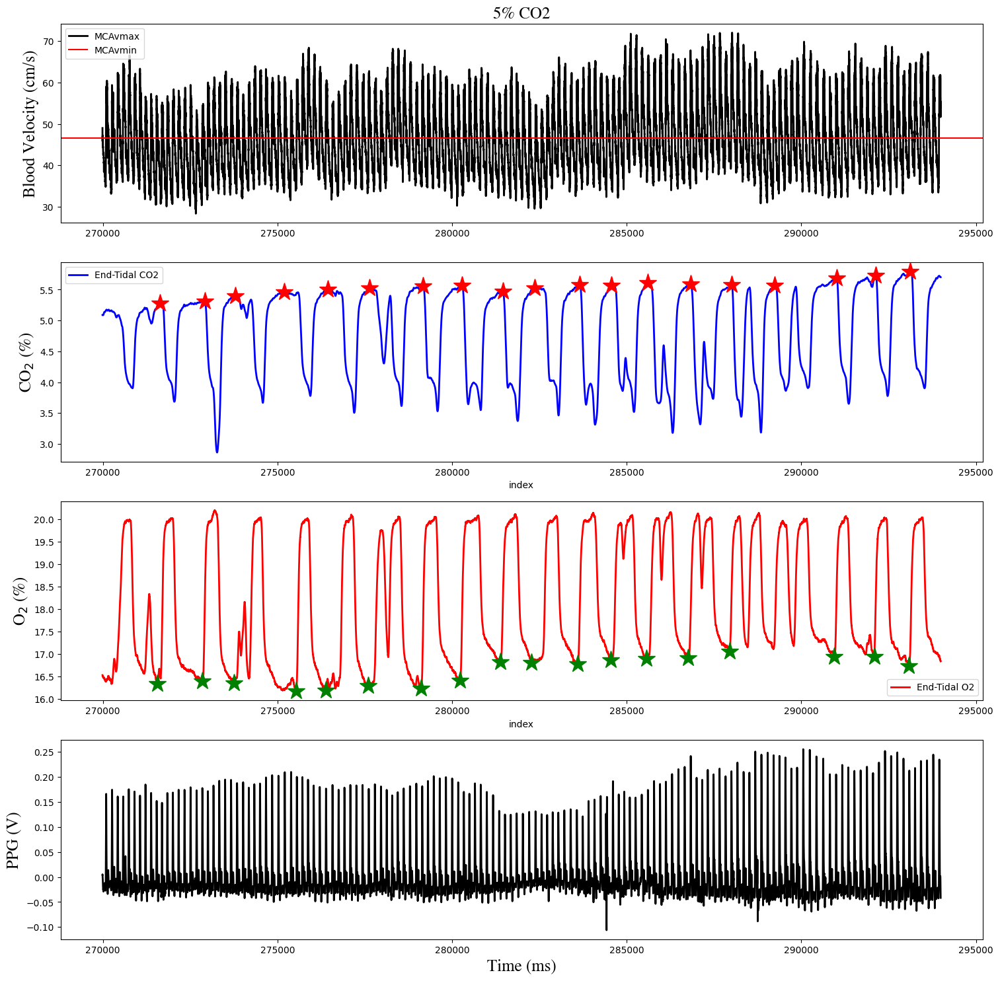

CVR: 2.7235280850513277 %/mmHg
CVR_SI: 48.07768424363253 %/mmHg
Percent CVR: 28.892431391872186 %/mmHg


In [12]:
# SUBJECT 3 #
filename = 'sub-003_ses-01_dat-20230209_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 1
O2prominence_5co2 = 3
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')



sub-003_ses-02_dat-20230405_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  185.7 s || 5% CO2:  183.8 s || Baseline 2:  122.95 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 4.235294117643207 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 33.67497396950934 mmHg
end tidal O2 mean: 118.62552379501253 mmHg
Stimulus index: 0.28387629316352203
MCAvmean mean_base: 29.935861683280514 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 43.6027403612635 mmHg
end tidal O2 mean: 129.6770185774136 mmHg
Stimulus index: 0.3362410767890524
MCAvmean mean_5CO2: 38.790952876907454 cm s-1
---------------------


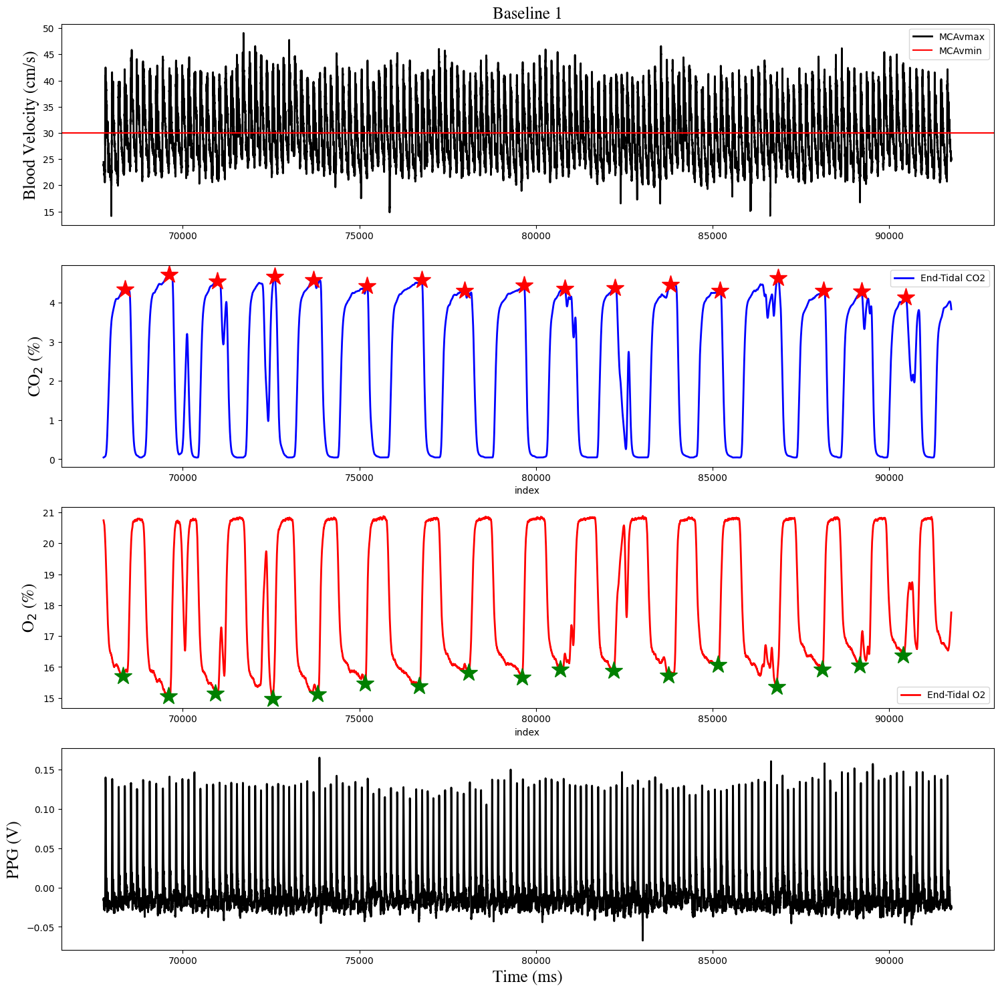

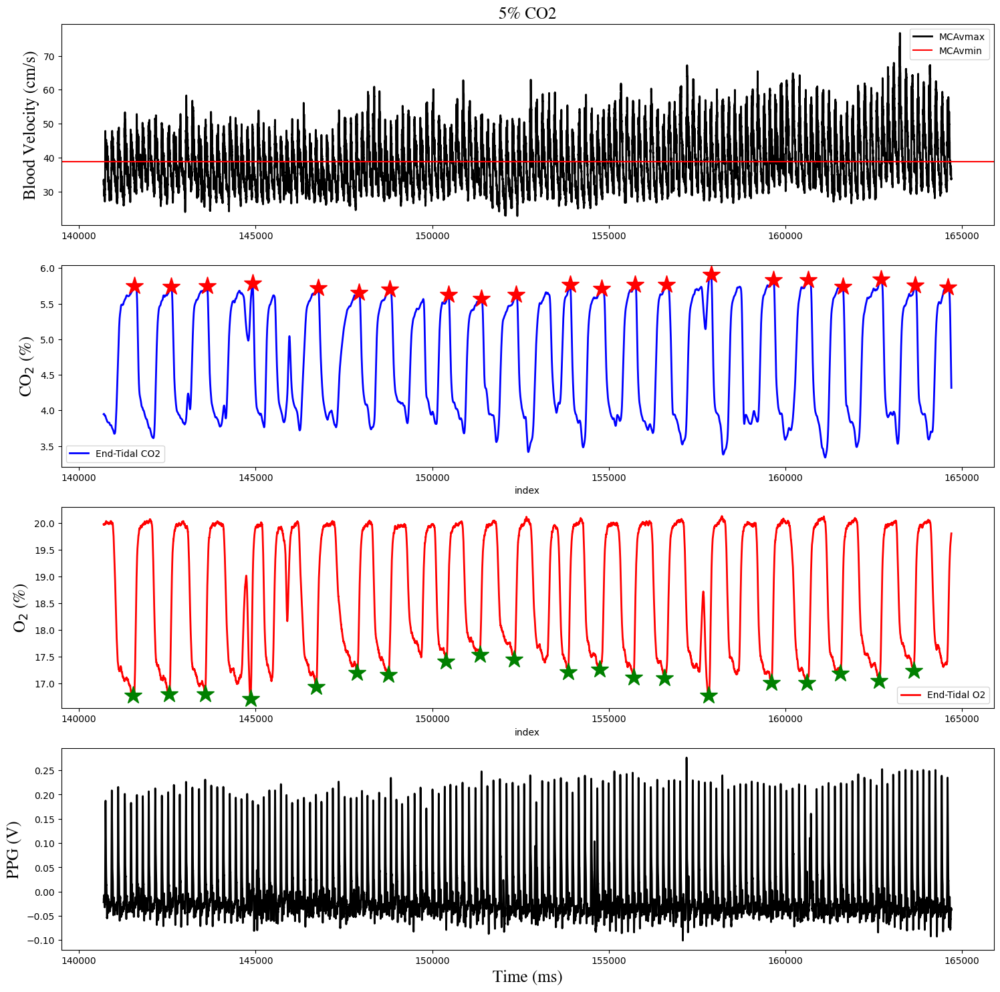

CVR: 2.9795434653262114 %/mmHg
CVR_SI: 74.40441565808639 %/mmHg
Percent CVR: 29.580211477836293 %/mmHg


In [13]:
# SUBJECT 3 SESSION 2 #

filename = 'sub-003_ses-02_dat-20230405_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 3
comment_end_5co2 = 5
comment_start_baseline2 = 6
comment_end_baseline2 = 7

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses02, save_log, log_ses02, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')

sub-004_ses-01_dat-20230207_task-tcd5co2_pwl_200hz.txt
---------------------


/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)
/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)


Baseline 1:  313.6 s || 5% CO2:  298.95 s || Baseline 2:  240.85 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.99499999999989 s || Baseline 2:  69.99499999999989 s
Sample rate: 199.99999999563443 Hz || Search window: 6.000000000130967 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 34.32236712320671 mmHg
end tidal O2 mean: 124.65949439358894 mmHg
Stimulus index: 0.27532894538173147
MCAvmean mean_base: 22.360865710706623 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 46.08177326781521 mmHg
end tidal O2 mean: 124.86970820857697 mmHg
Stimulus index: 0.3690388480034101
MCAvmean mean_5CO2: 30.89139598865416 cm s-1
---------------------


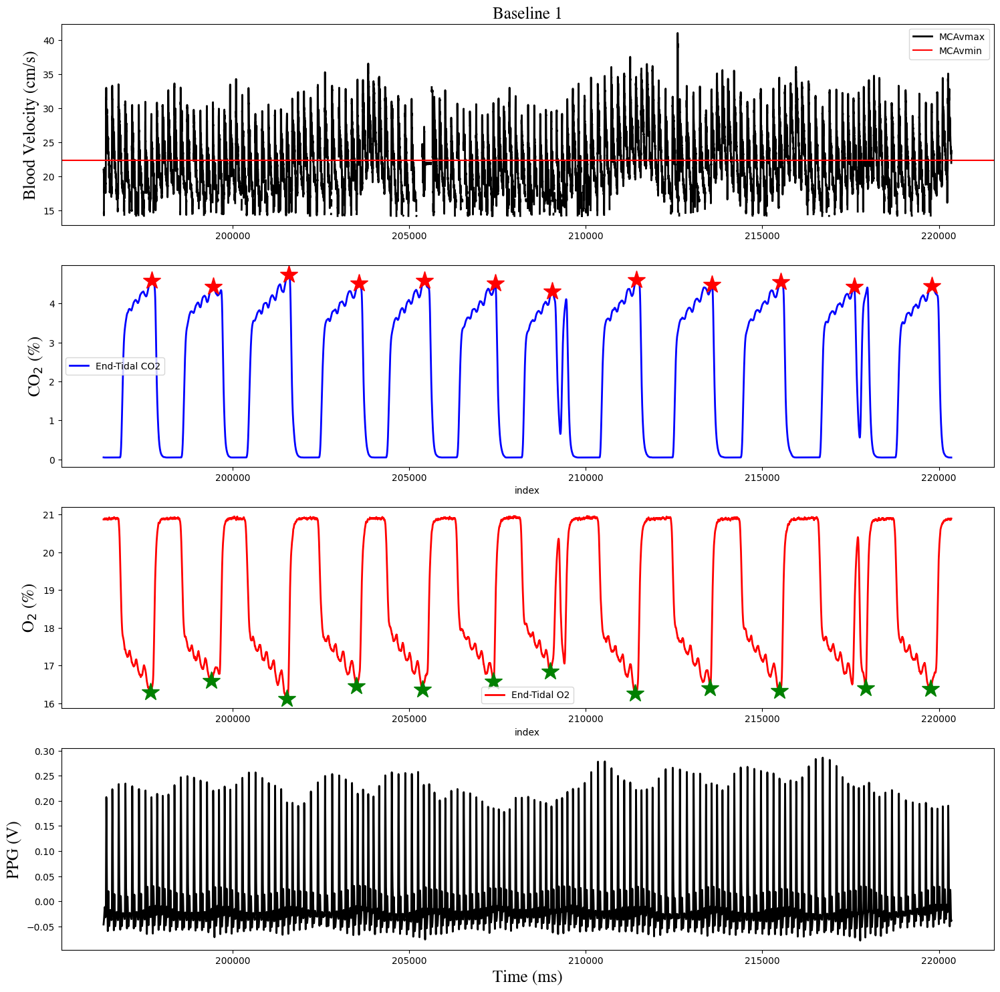

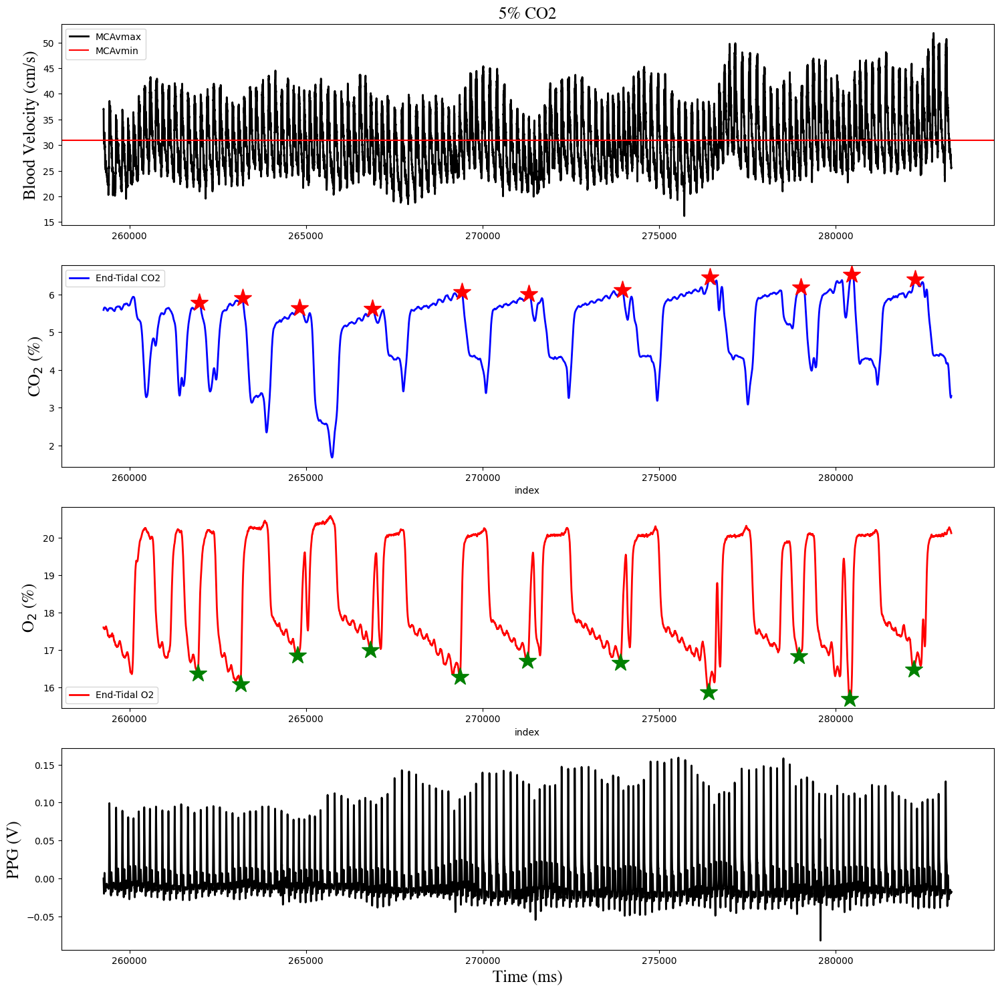

CVR: 3.244158206518942 %/mmHg
CVR_SI: 53.62146531536768 %/mmHg
Percent CVR: 38.14937394782093 %/mmHg


In [14]:
# SUBJECT 4 #
filename = 'sub-004_ses-01_dat-20230207_task-tcd5co2_pwl_200hz.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 1
O2prominence_5co2 = 3
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 1
comment_end_5co2 = 2
comment_start_baseline2 = 2
comment_end_baseline2 = 3

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-004_ses-02_dat-20230418_task-tcd5co2.txt
---------------------
Baseline 1:  188.95 s || 5% CO2:  246.9 s || Baseline 2:  122.75 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 5.999999999994543 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 33.57357625067865 mmHg
end tidal O2 mean: 124.72005365505076 mmHg
Stimulus index: 0.26919148338033955
MCAvmean mean_base: 27.139258845113527 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 44.8660219515919 mmHg
end tidal O2 mean: 124.89306817493544 mmHg
Stimulus index: 0.35923548526127075
MCAvmean mean_5CO2: 37.20956042067504 cm s-1
---------------------


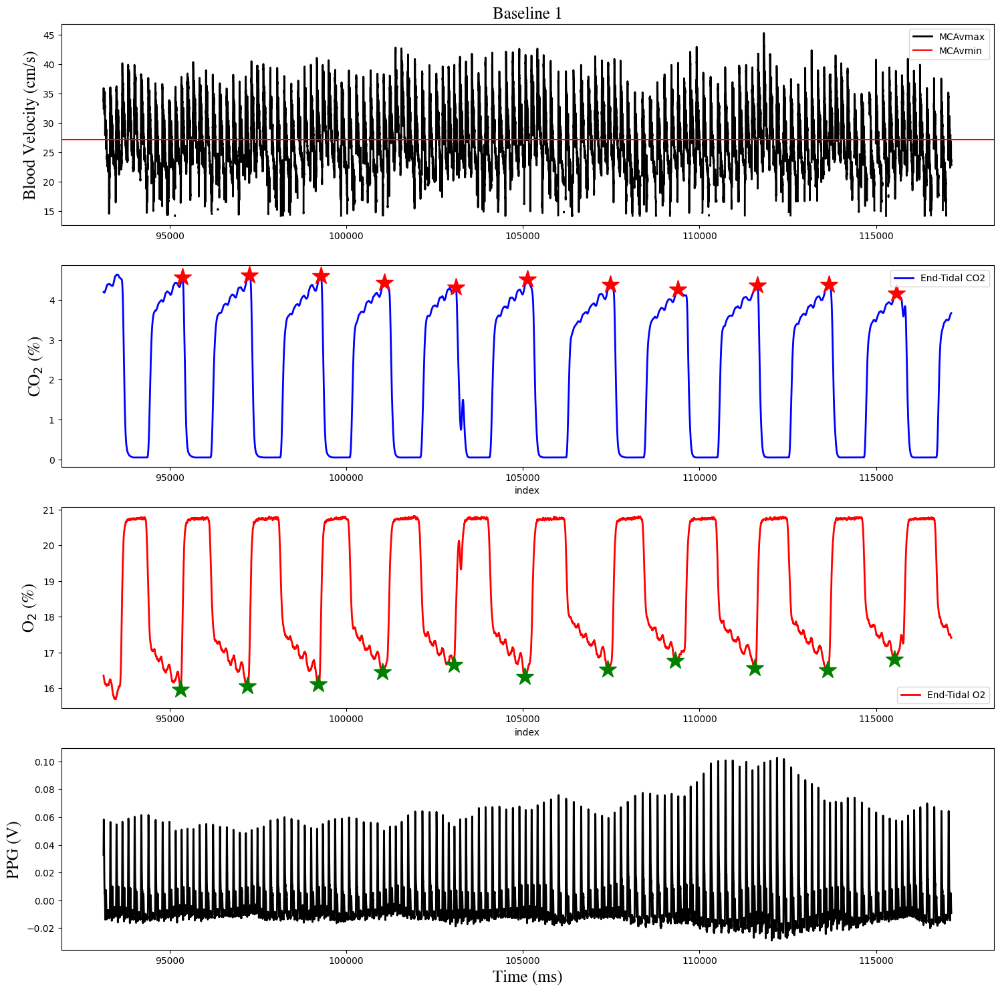

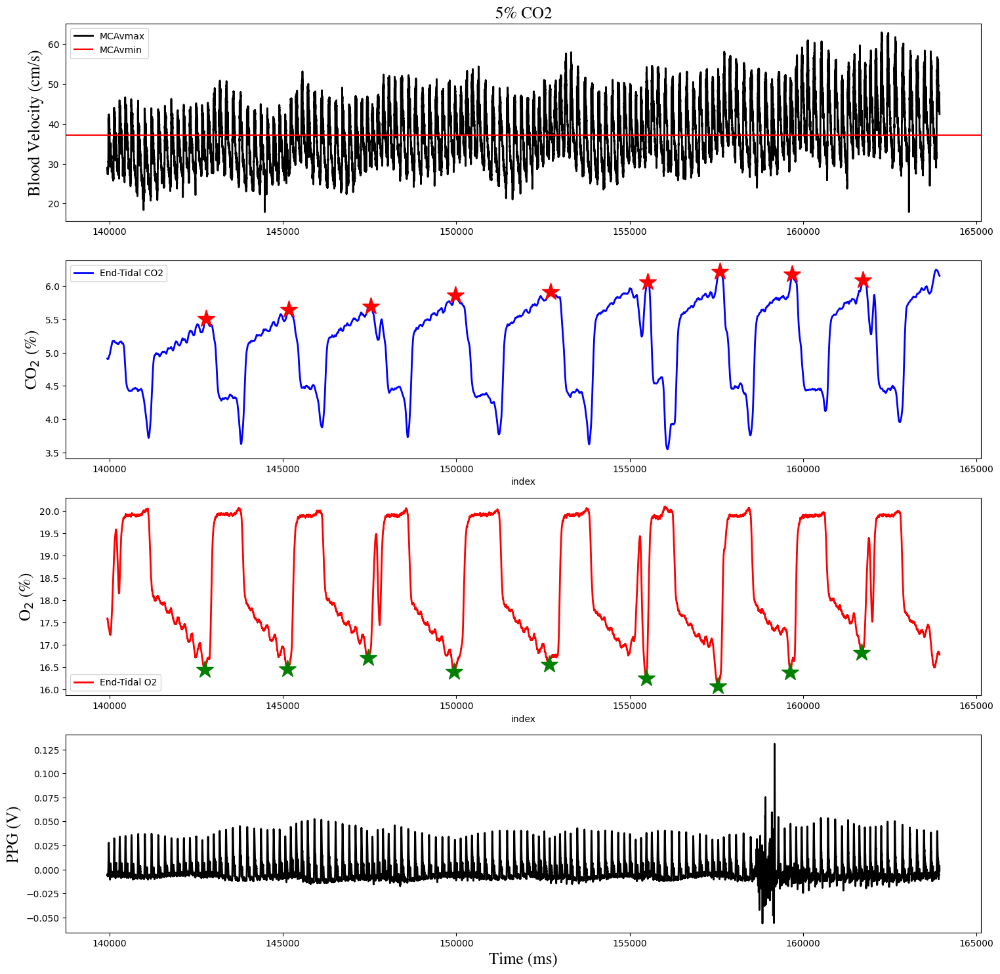

CVR: 3.2859161916655184 %/mmHg
CVR_SI: 54.27832711698921 %/mmHg
Percent CVR: 37.10603017213452 %/mmHg


In [15]:
# SUBJECT 4 SESSION 2 #

filename = 'sub-004_ses-02_dat-20230418_task-tcd5co2.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses02, save_log, log_ses02, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')

sub-005_ses-01_dat-20230224_task-tcd5co2_pwl.txt
---------------------


/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (0,1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)
/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (0,1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)


Baseline 1:  133.15 s || 5% CO2:  220.6 s || Baseline 2:  128.05 s
-------After Cropping-------
Baseline 1:  119.99499999999989 s || 5% CO2:  119.99499999999989 s || Baseline 2:  69.99500000000012 s
Sample rate: 199.99999999563443 Hz || Search window: 5.1428571429694 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 28.00702741946184 mmHg
end tidal O2 mean: 124.94104195831382 mmHg
Stimulus index: 0.22416194855175206
MCAvmean mean_base: 26.39113677835526 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 41.656849744026665 mmHg
end tidal O2 mean: 124.91267746943598 mmHg
Stimulus index: 0.33348776591726964
MCAvmean mean_5CO2: 36.62498083822724 cm s-1
---------------------


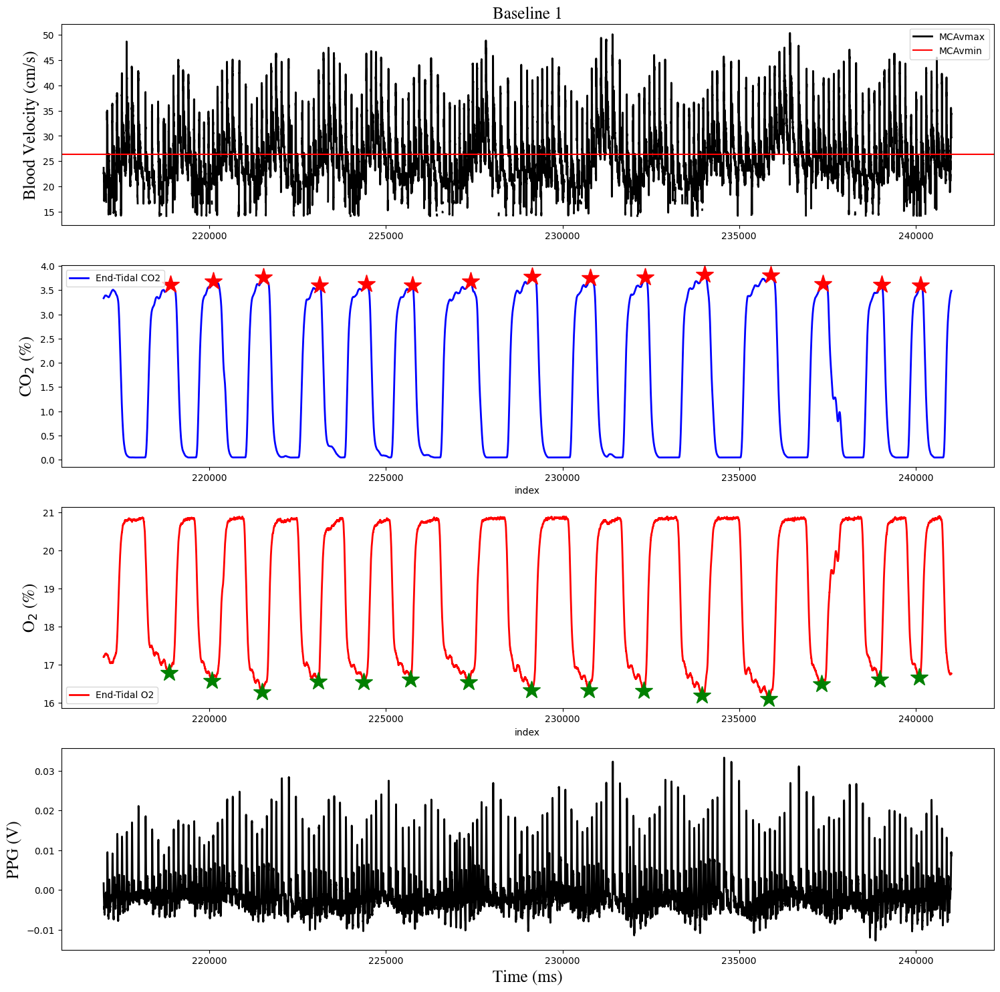

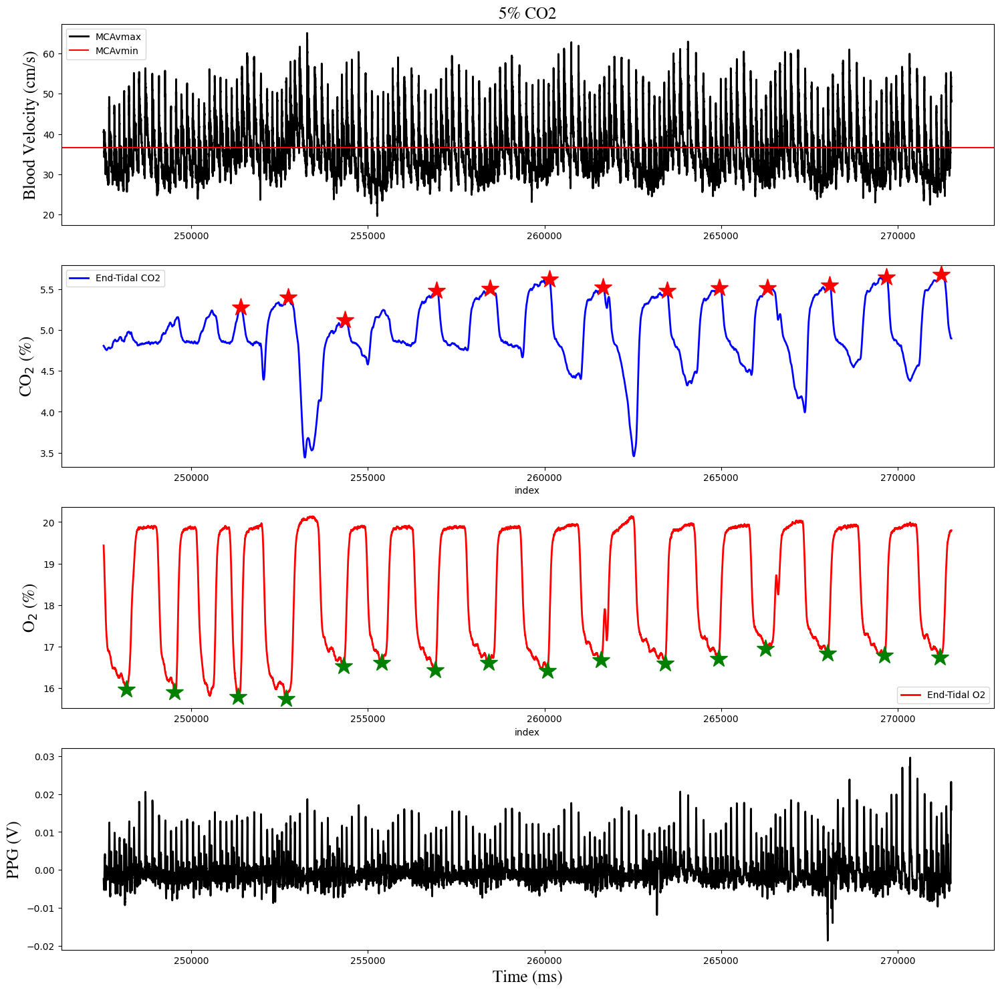

CVR: 2.840885297523804 %/mmHg
CVR_SI: 46.719126424890725 %/mmHg
Percent CVR: 38.77757955566841 %/mmHg


In [16]:
# SUBJECT 5 #
filename = 'sub-005_ses-01_dat-20230224_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 3
comment_end_baseline2 = 4

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-006_ses-01_dat-20230227_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  188.15 s || 5% CO2:  157.05 s || Baseline 2:  131.6 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 3.9999999999963625 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 35.24550984129273 mmHg
end tidal O2 mean: 111.28786939197448 mmHg
Stimulus index: 0.31670576527215333
MCAvmean mean_base: 31.298229305887848 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 45.80897378464509 mmHg
end tidal O2 mean: 116.43171560722105 mmHg
Stimulus index: 0.393440683629367
MCAvmean mean_5CO2: 39.25693601731642 cm s-1
---------------------


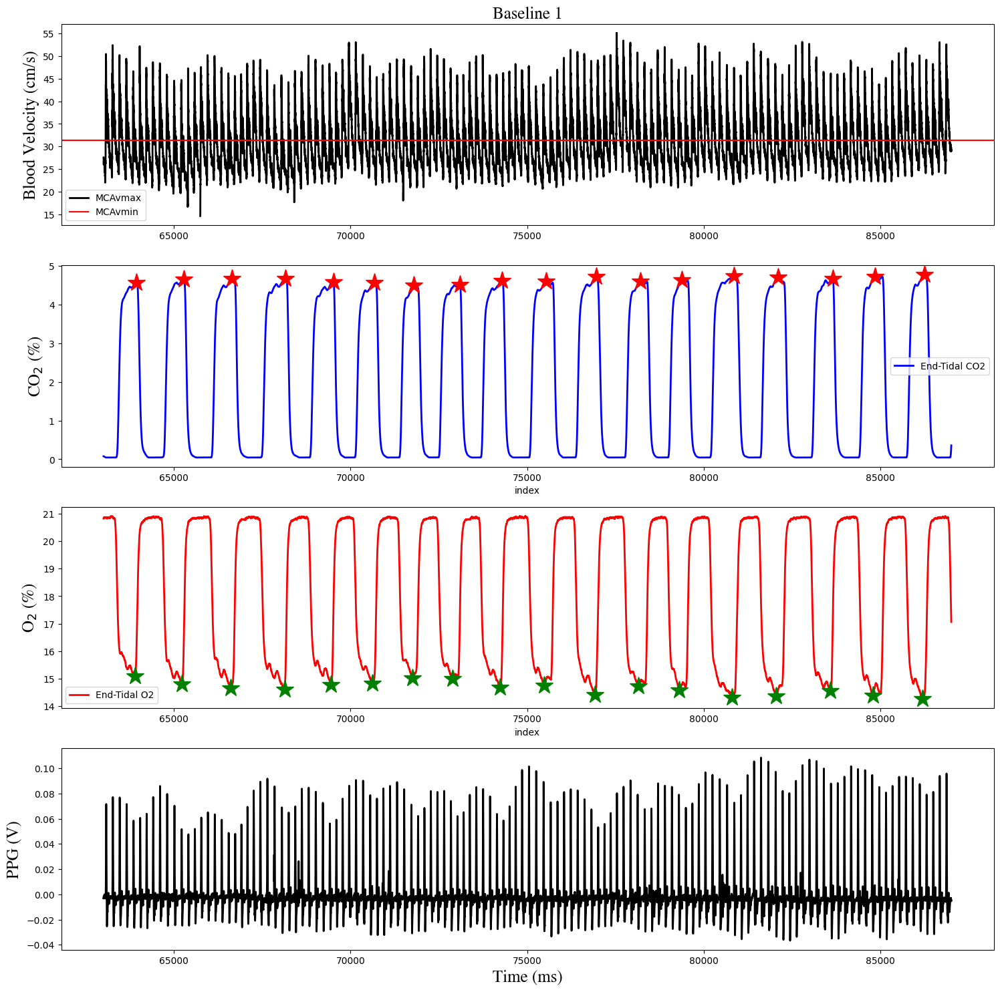

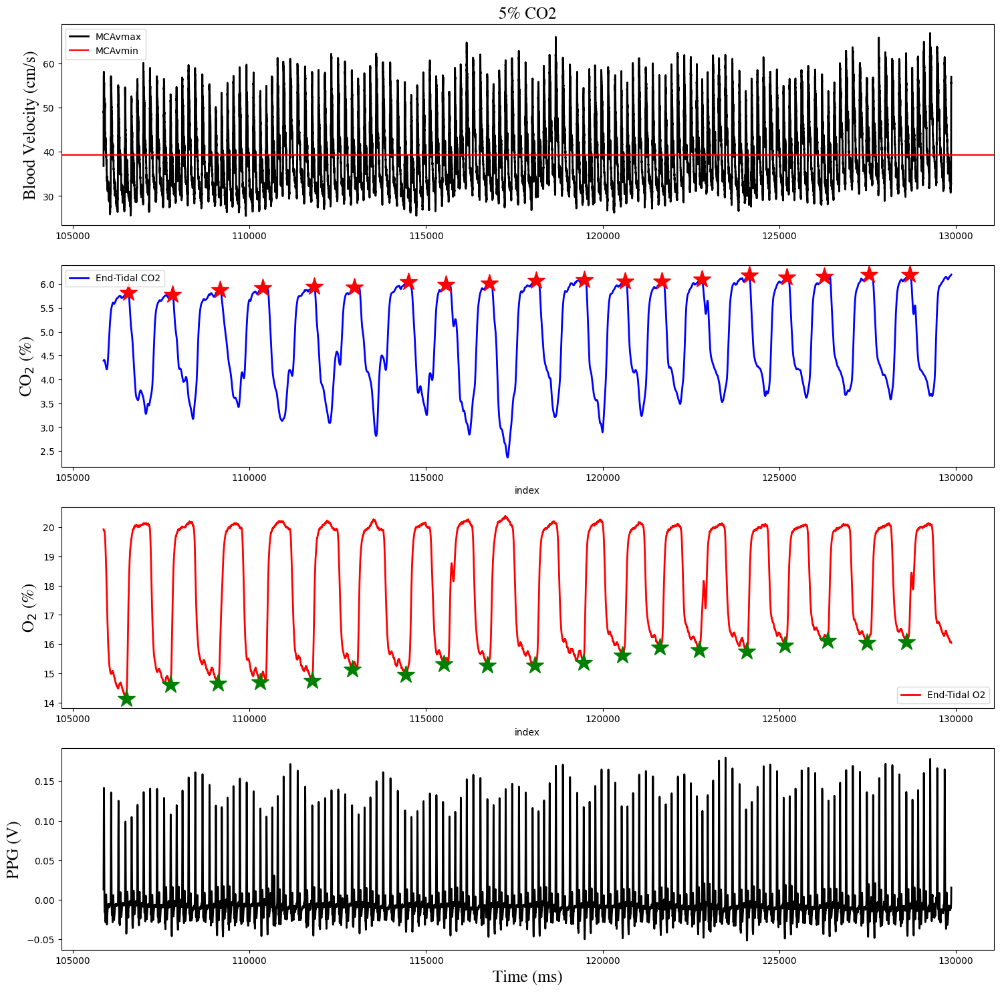

CVR: 2.4072232998696688 %/mmHg
CVR_SI: 43.648210818220605 %/mmHg
Percent CVR: 25.42861653177093 %/mmHg


In [17]:
# SUBJECT 6 #
filename = 'sub-006_ses-01_dat-20230227_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 1
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-007_ses-01_dat-20230228_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  156.7 s || 5% CO2:  189.4 s || Baseline 2:  98.55 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 3.7894736842070795 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 31.248830144570963 mmHg
end tidal O2 mean: 119.82319299347981 mmHg
Stimulus index: 0.2607911654154582
MCAvmean mean_base: 39.73607734191677 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 44.744758449788996 mmHg
end tidal O2 mean: 121.81535215422383 mmHg
Stimulus index: 0.36731625085432645
MCAvmean mean_5CO2: 55.69559232510212 cm s-1
---------------------


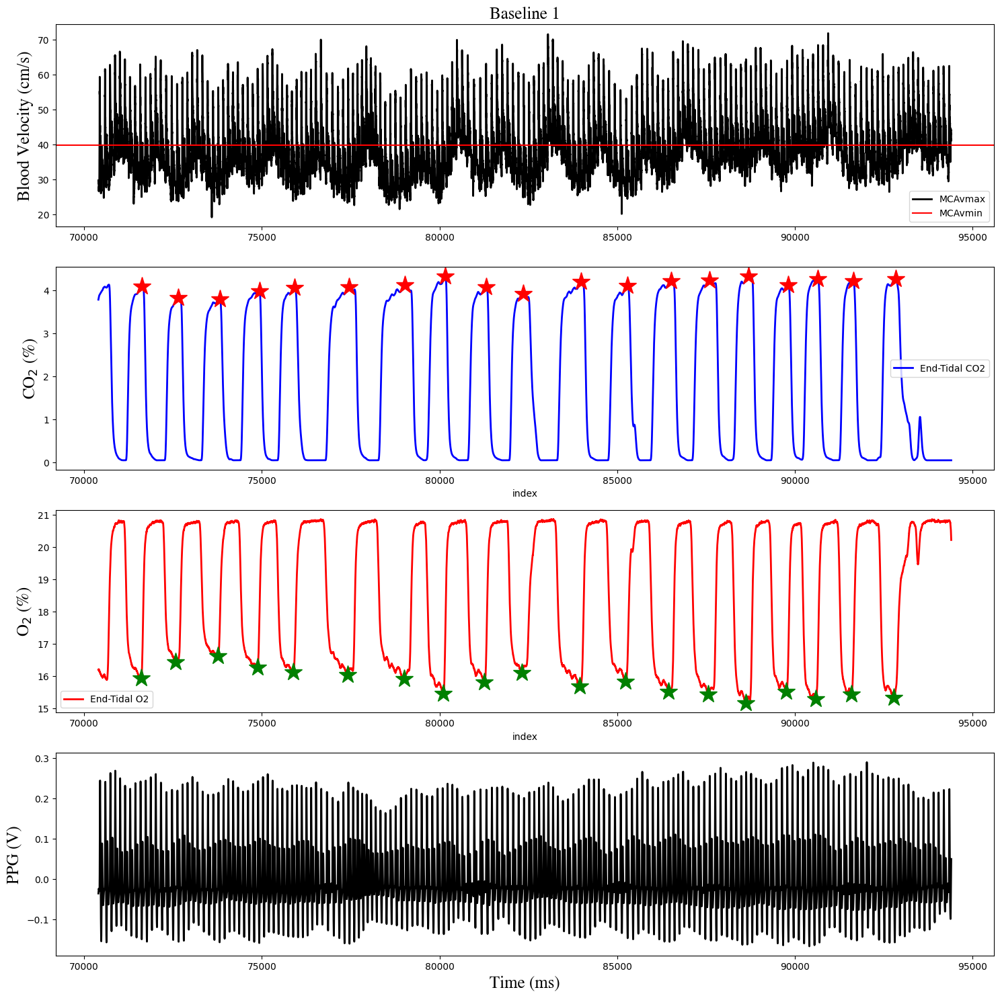

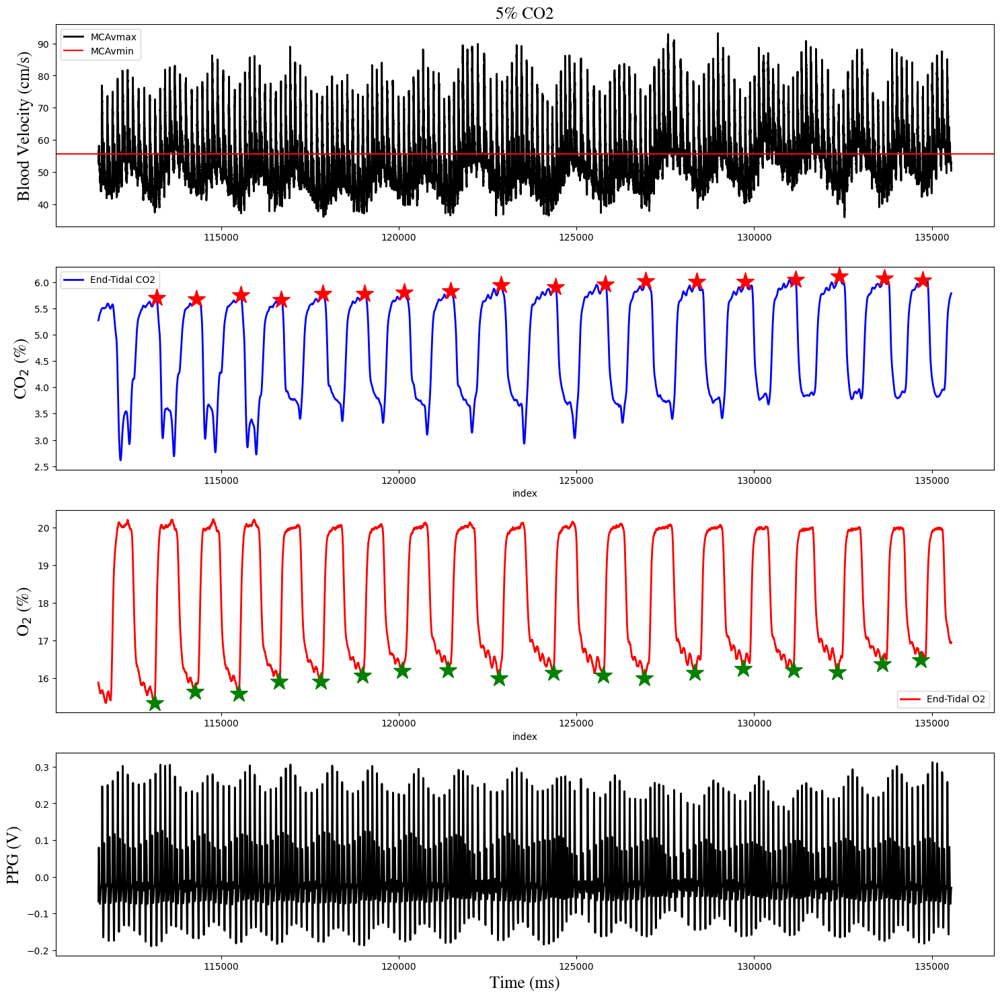

CVR: 2.9759931966461433 %/mmHg
CVR_SI: 49.66146812973074 %/mmHg
Percent CVR: 40.16379081875298 %/mmHg


In [18]:
# SUBJECT 7 #
filename = 'sub-007_ses-01_dat-20230228_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-008_ses-01_dat-20230228_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  174.9 s || 5% CO2:  170.7 s || Baseline 2:  97.35 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 3.272727272724296 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 30.2199275224404 mmHg
end tidal O2 mean: 126.47664288753154 mmHg
Stimulus index: 0.23893682527068066
MCAvmean mean_base: 26.714288389474927 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 41.91429673975769 mmHg
end tidal O2 mean: 122.56328357639146 mmHg
Stimulus index: 0.34198085688225927
MCAvmean mean_5CO2: 35.722992183862495 cm s-1
---------------------


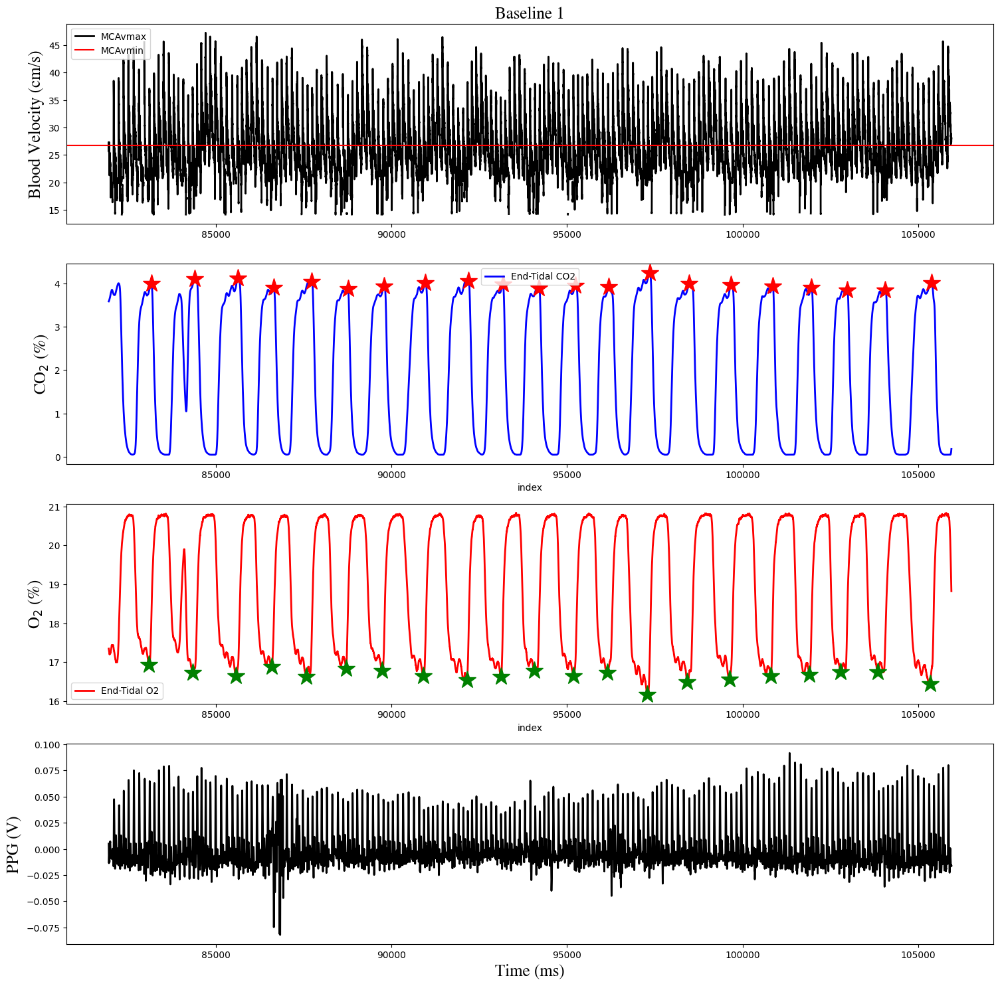

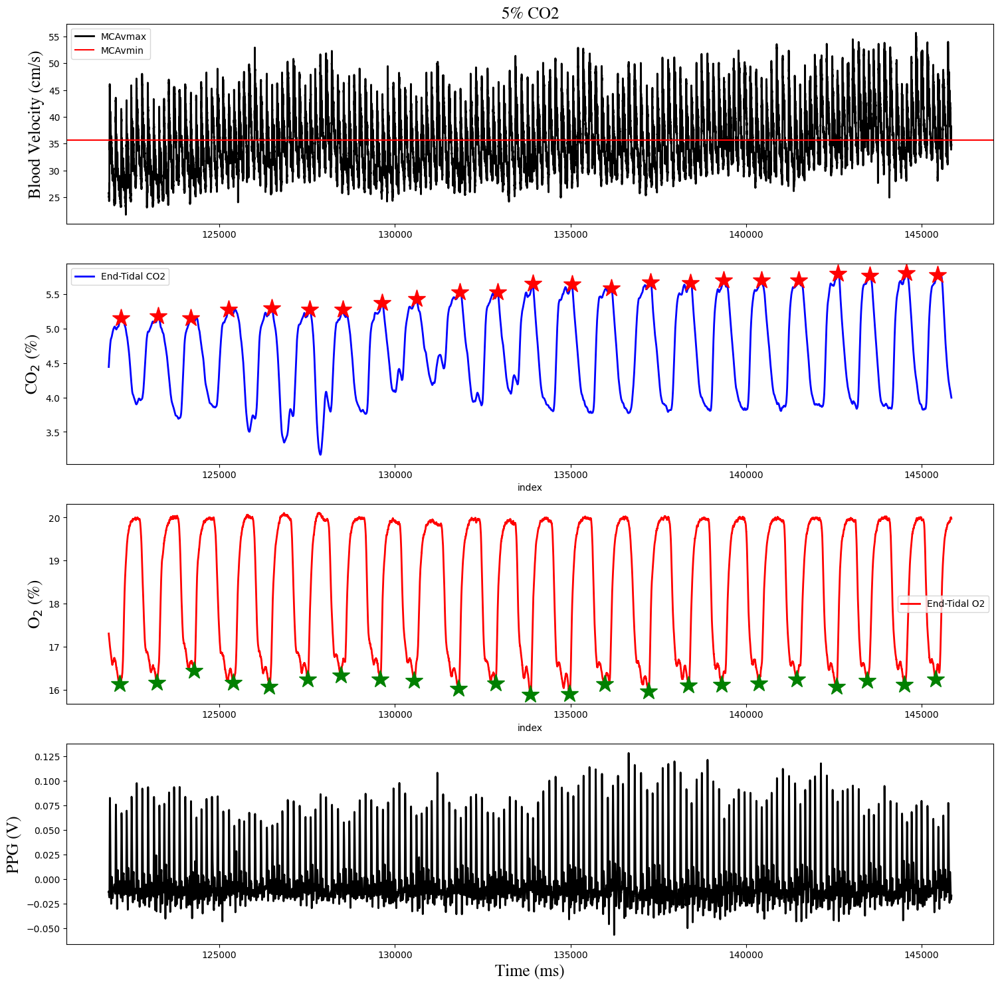

CVR: 2.883645677423651 %/mmHg
CVR_SI: 43.105491800160564 %/mmHg
Percent CVR: 33.7224172437132 %/mmHg


In [19]:
# SUBJECT 8 #
filename = 'sub-008_ses-01_dat-20230228_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-009_ses-01_dat-20230307_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  166.85 s || 5% CO2:  173.4 s || Baseline 2:  194.2 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 5.5384615384565015 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 34.1089968254528 mmHg
end tidal O2 mean: 114.21004389610057 mmHg
Stimulus index: 0.2986514641083801
MCAvmean mean_base: 27.677191899655156 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 43.455598949702505 mmHg
end tidal O2 mean: 119.6653592055234 mmHg
Stimulus index: 0.3631426775318343
MCAvmean mean_5CO2: 32.900095528959646 cm s-1
---------------------


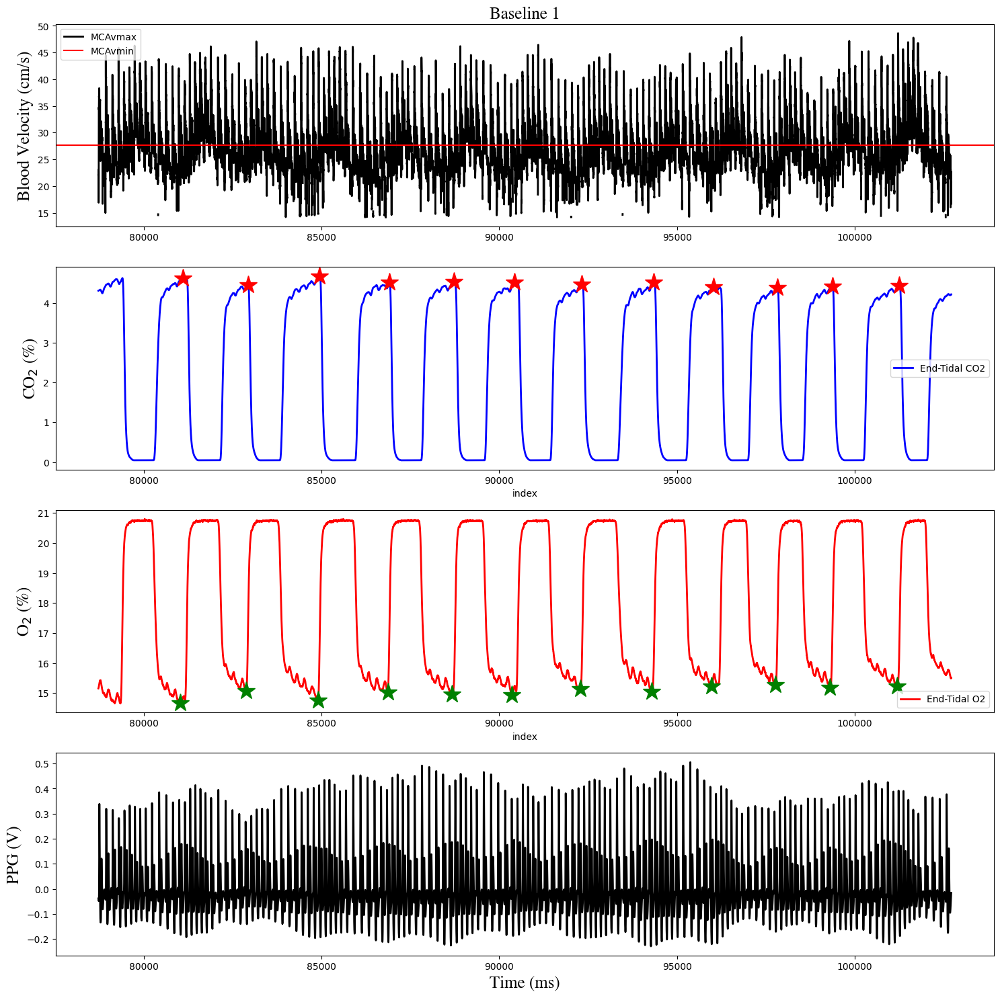

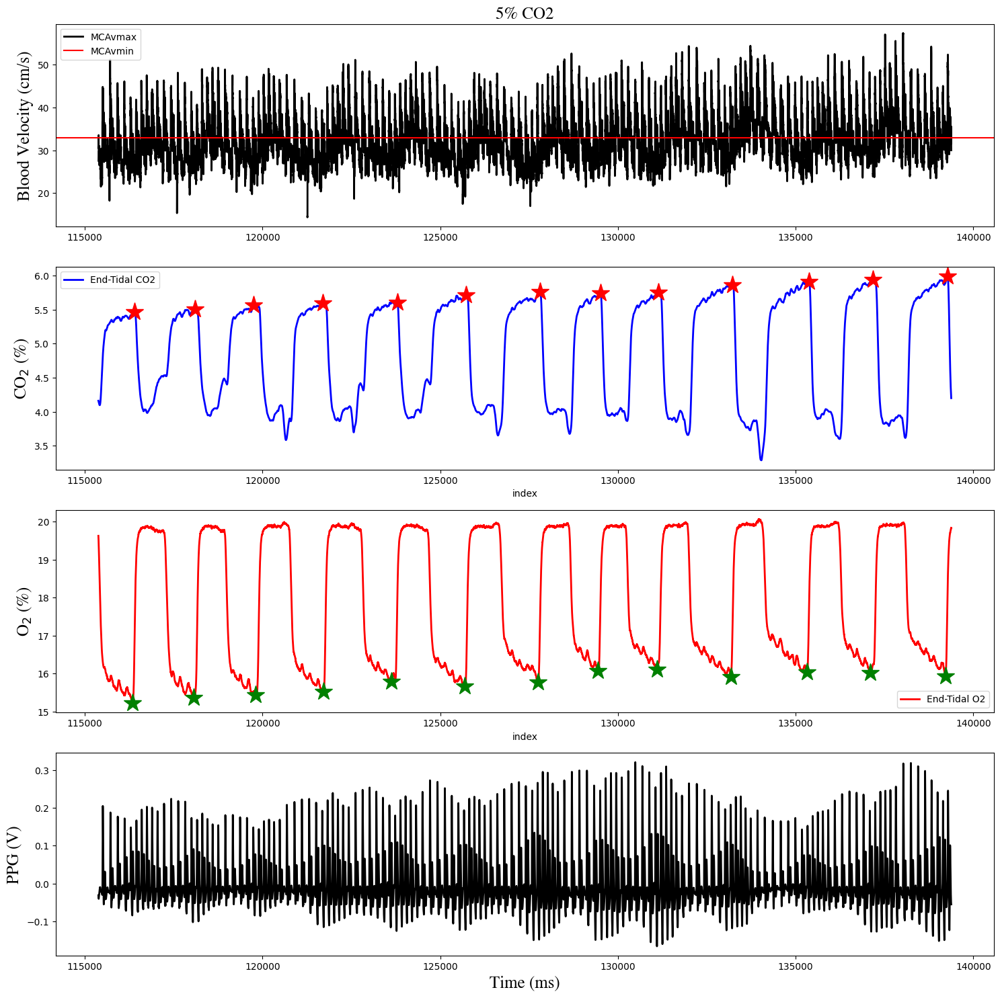

CVR: 2.018999595704909 %/mmHg
CVR_SI: 38.541284811474476 %/mmHg
Percent CVR: 18.8707859100748 %/mmHg


In [20]:
# SUBJECT 9 #
filename = 'sub-009_ses-01_dat-20230307_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 2
comment_end_baseline1 = 3
comment_start_5co2 = 4
comment_end_5co2 = 5
comment_start_baseline2 = 6
comment_end_baseline2 = 7

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-010_ses-01_dat-20230320_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  208.65 s || 5% CO2:  219.95 s || Baseline 2:  114.7 s
-------After Cropping-------
Baseline 1:  119.99499999999999 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 3.272727272724296 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 33.73172116868448 mmHg
end tidal O2 mean: 113.99119544128375 mmHg
Stimulus index: 0.2959151453592704
MCAvmean mean_base: 35.33624640322154 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 44.26790320717266 mmHg
end tidal O2 mean: 124.23475823365673 mmHg
Stimulus index: 0.35632462151948663
MCAvmean mean_5CO2: 45.50624699636296 cm s-1
---------------------


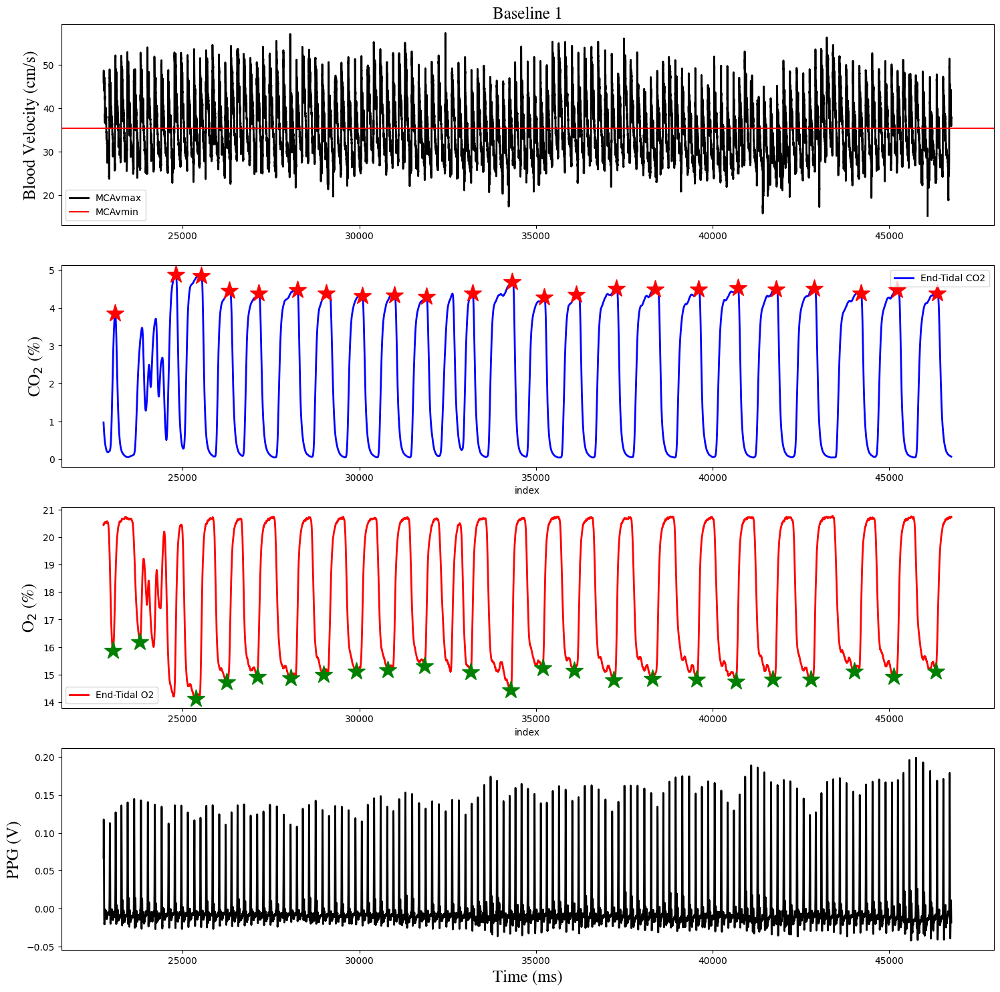

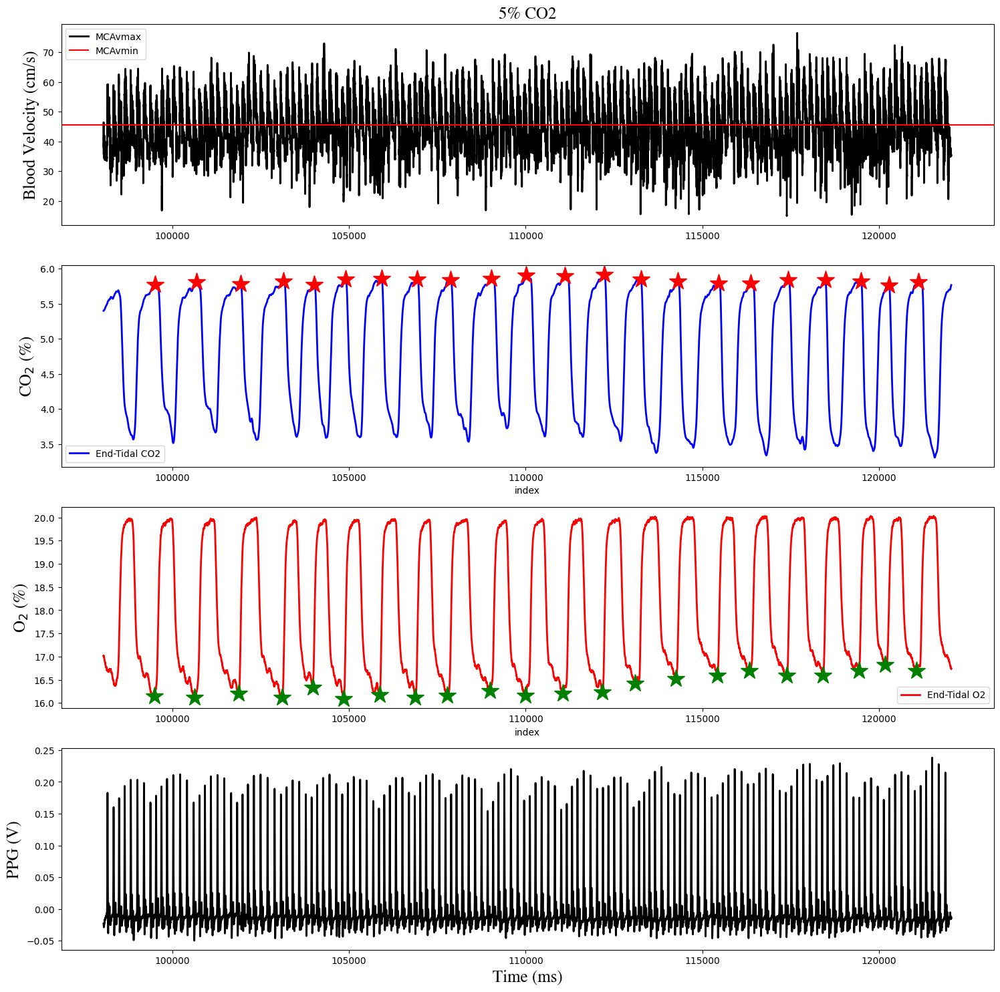

CVR: 2.73160122046315 %/mmHg
CVR_SI: 62.75267490876552 %/mmHg
Percent CVR: 28.780647715356224 %/mmHg


In [21]:
# SUBJECT 10 #
filename = 'sub-010_ses-01_dat-20230320_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 3
comment_end_5co2 = 4
comment_start_baseline2 = 5
comment_end_baseline2 = 6

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-011_ses-01_dat-20230328_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  191.95 s || 5% CO2:  245.45 s || Baseline 2:  122.2 s


/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)
/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)


-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.99500000000012 s || Baseline 2:  69.99500000000012 s
Sample rate: 199.99999999563443 Hz || Search window: 1.565217391338513 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 37.331017415140074 mmHg
end tidal O2 mean: 107.11910548948295 mmHg
Stimulus index: 0.3485000854381226
MCAvmean mean_base: 26.11450510595987 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 44.16916177035358 mmHg
end tidal O2 mean: 124.4754779816957 mmHg
Stimulus index: 0.3548422748523104
MCAvmean mean_5CO2: 30.160765061254633 cm s-1
---------------------


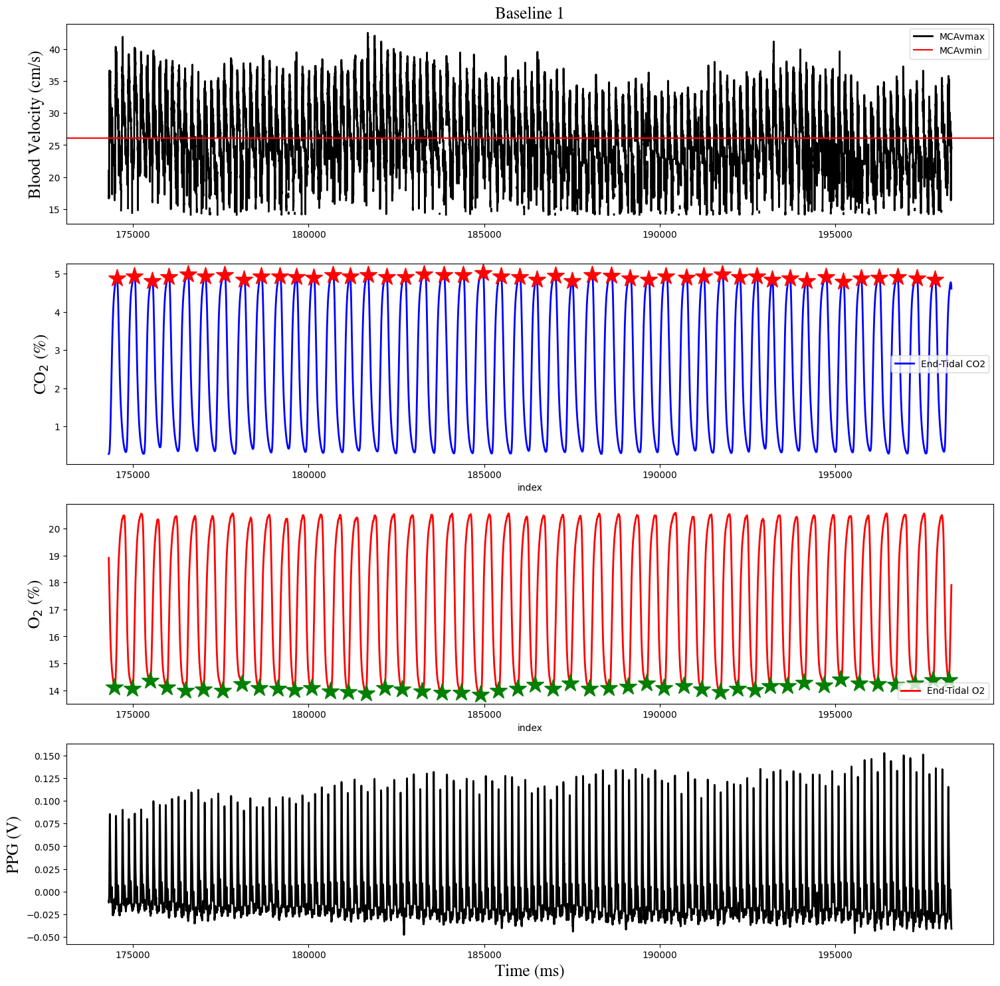

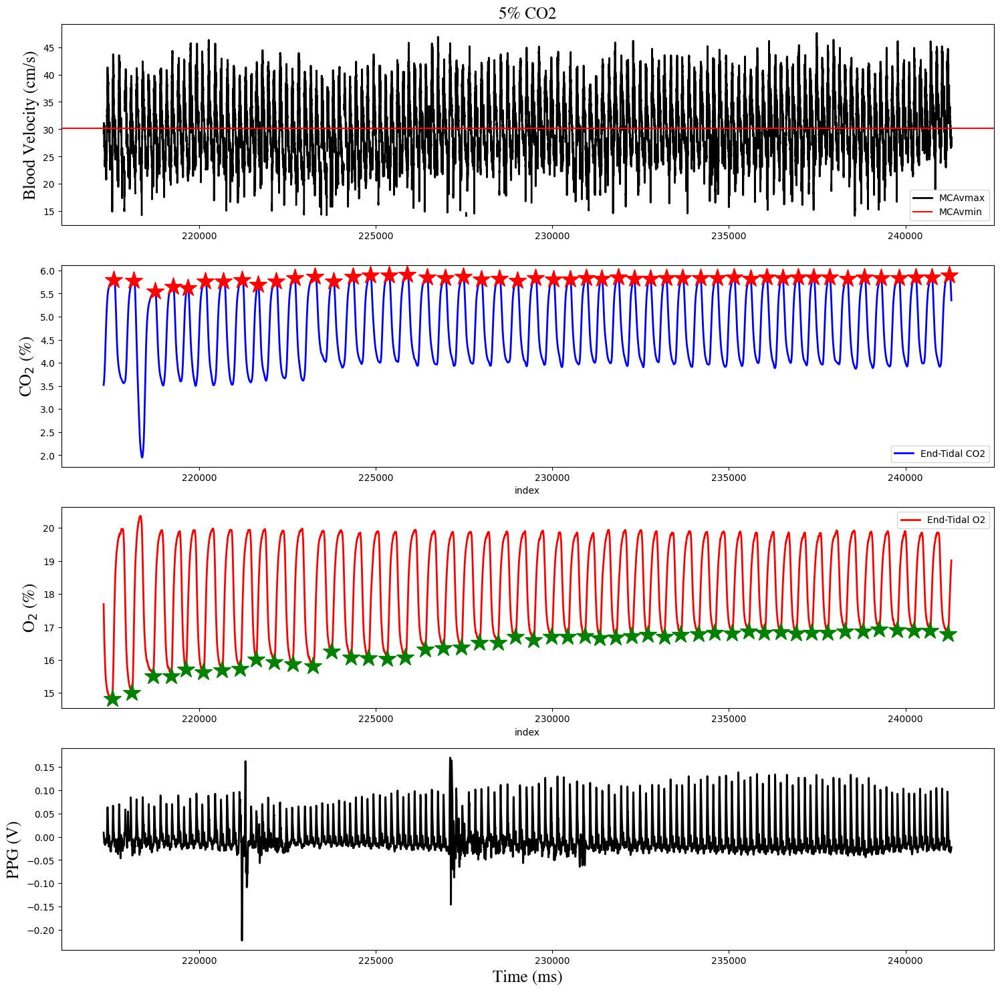

CVR: 2.265863357840198 %/mmHg
CVR_SI: 321.7877607305226 %/mmHg
Percent CVR: 15.494300730100075 %/mmHg


In [22]:
# SUBJECT 11 #
filename = 'sub-011_ses-01_dat-20230328_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-012_ses-01_dat-20230330_task-tcd5co2_pwl.txt
---------------------


/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)
/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)


Baseline 1:  186.85 s || 5% CO2:  242.4 s || Baseline 2:  188.25 s
-------After Cropping-------
Baseline 1:  119.99499999999989 s || 5% CO2:  119.99499999999989 s || Baseline 2:  69.99500000000012 s
Sample rate: 199.99999999563443 Hz || Search window: 3.6000000000785803 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 28.22767375508761 mmHg
end tidal O2 mean: 124.2524827739693 mmHg
Stimulus index: 0.22717995749378508
MCAvmean mean_base: 33.29779428775039 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 38.00901538018731 mmHg
end tidal O2 mean: 124.17392876162576 mmHg
Stimulus index: 0.3060949730692057
MCAvmean mean_5CO2: 44.24011779534095 cm s-1
---------------------


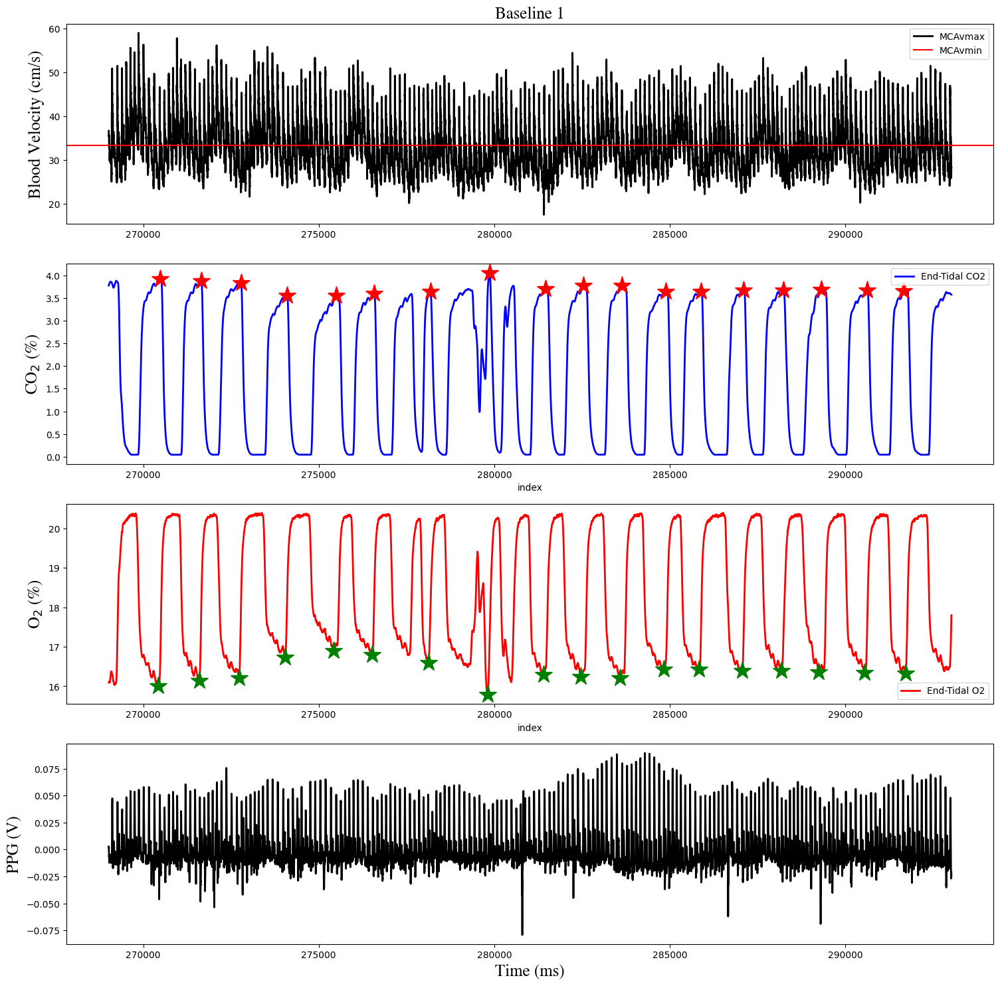

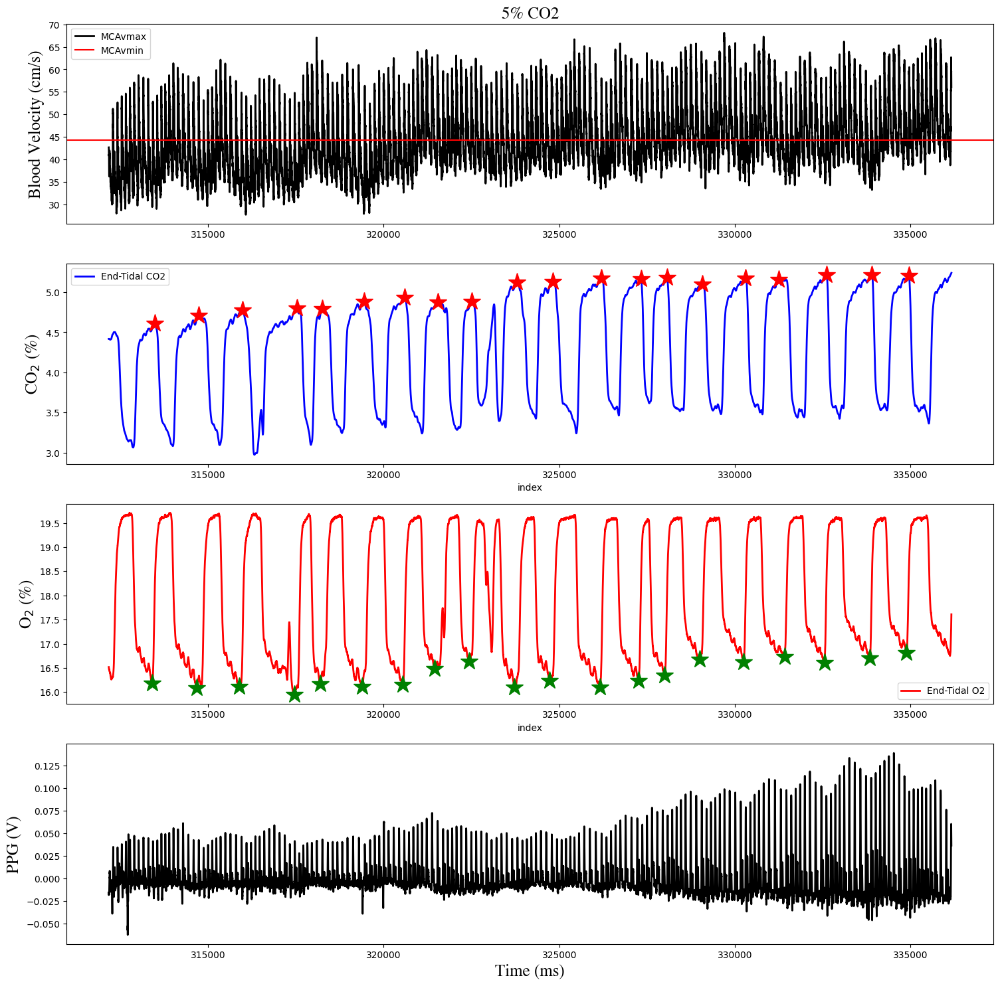

CVR: 3.3596625405091767 %/mmHg
CVR_SI: 54.84931232906034 %/mmHg
Percent CVR: 32.862007053770604 %/mmHg


In [23]:
# SUBJECT 12 #
filename = 'sub-012_ses-01_dat-20230330_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-013_ses-01_dat-20230331_task-tcd5co2_pwl.txt
---------------------


/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (0,1,2,3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)
/Users/ghayes/Documents/GitHub/End-Tidal-Extraction/pwl-analysis/pwl_cvr_functions.py:261: DtypeWarning: Columns (0,1,2,3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filepath, sep='\t',skiprows=(0,1,2,3,4,5),header=None, names=cols)


Baseline 1:  184.3 s || 5% CO2:  176.85 s || Baseline 2:  123.7 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.99500000000003 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 1.9459459459441761 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 34.937617540420966 mmHg
end tidal O2 mean: 109.5535693243889 mmHg
Stimulus index: 0.31890898448931804
MCAvmean mean_base: 28.555240509129508 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 40.96608362029329 mmHg
end tidal O2 mean: 122.9565374451197 mmHg
Stimulus index: 0.3331753192755453
MCAvmean mean_5CO2: 32.86143988867801 cm s-1
---------------------


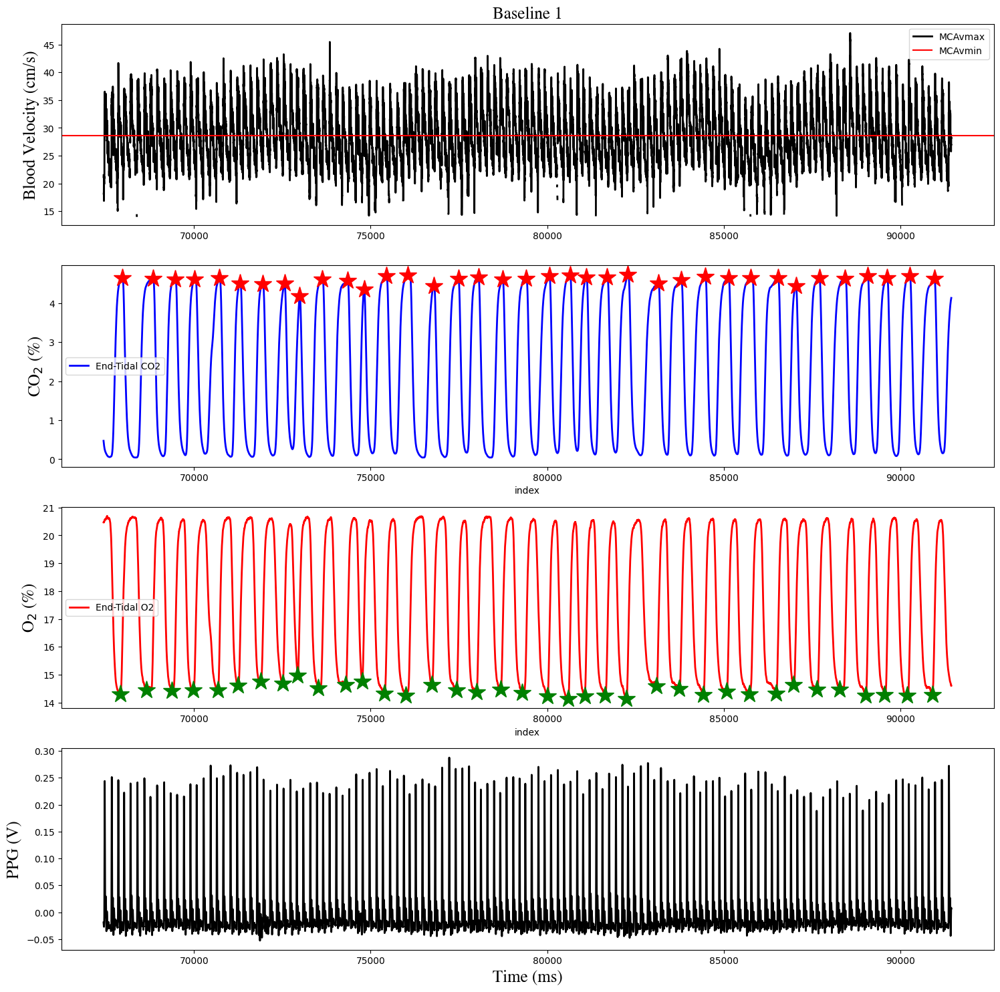

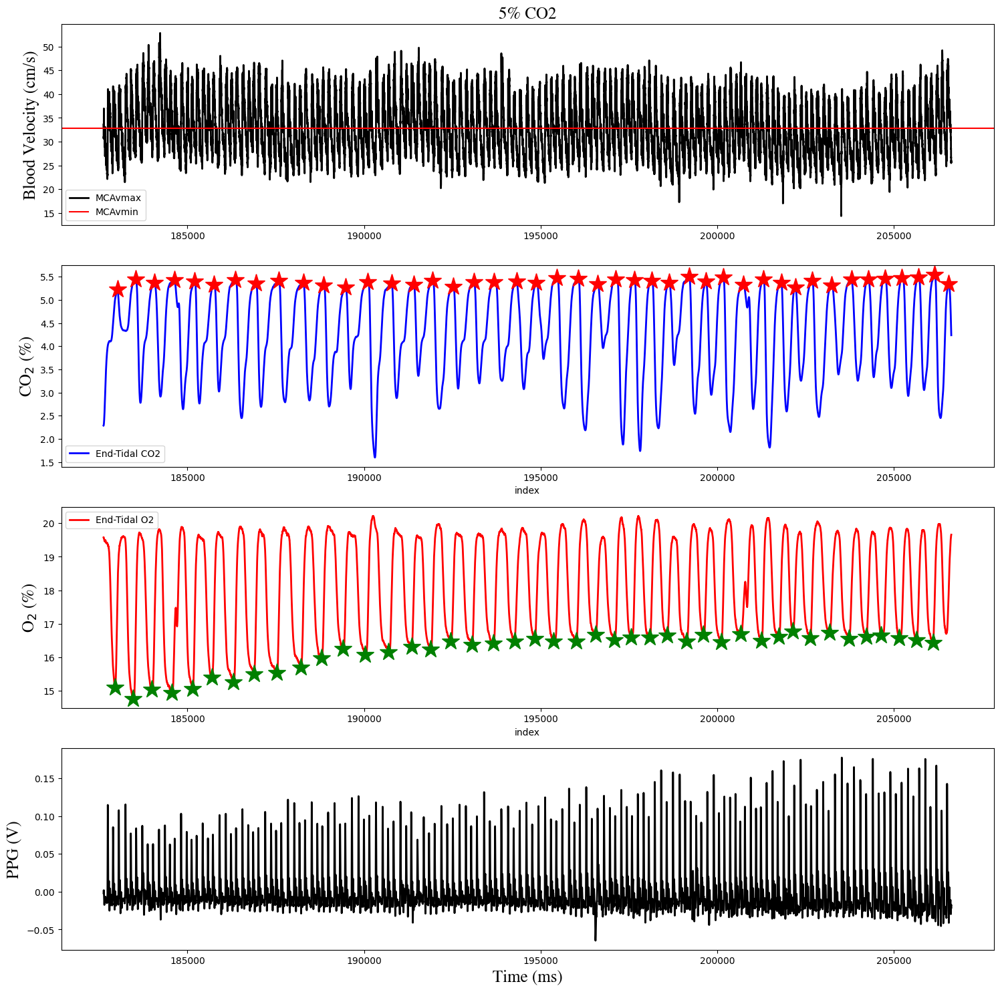

CVR: 2.501505660814389 %/mmHg
CVR_SI: 139.2299442808297 %/mmHg
Percent CVR: 15.080242024828147 %/mmHg


In [24]:
# SUBJECT 13 #
filename = 'sub-013_ses-01_dat-20230331_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 7
comment_end_5co2 = 8
comment_start_baseline2 = 9
comment_end_baseline2 = 10

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-014_ses-01_dat-20230518_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  181.3 s || 5% CO2:  186.35 s || Baseline 2:  121.55 s
-------After Cropping-------
Baseline 1:  119.99499999999998 s || 5% CO2:  119.99499999999995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 2.7692307692282507 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 30.623244248479995 mmHg
end tidal O2 mean: 118.40054480583109 mmHg
Stimulus index: 0.258641075500962
MCAvmean mean_base: 29.127135414014546 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 38.74118152731871 mmHg
end tidal O2 mean: 123.98239605613837 mmHg
Stimulus index: 0.3124732442642661
MCAvmean mean_5CO2: 34.733891296329965 cm s-1
---------------------


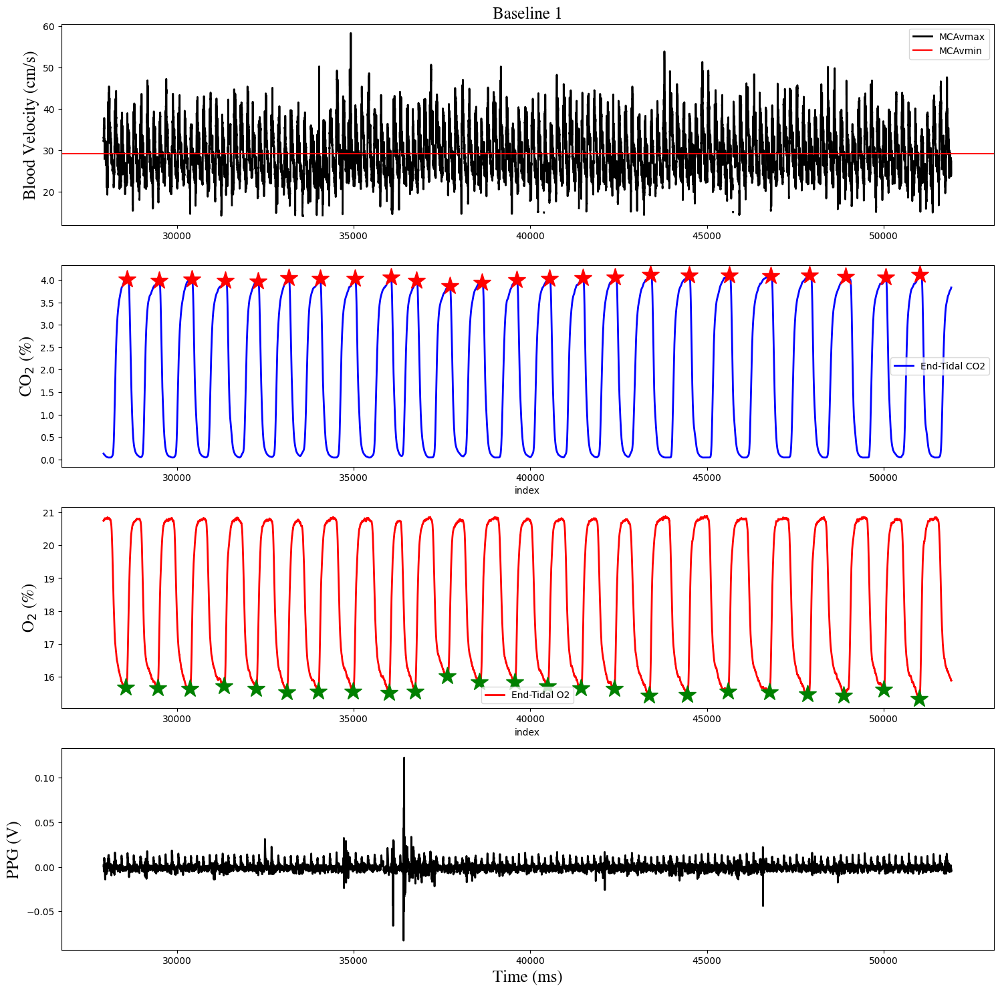

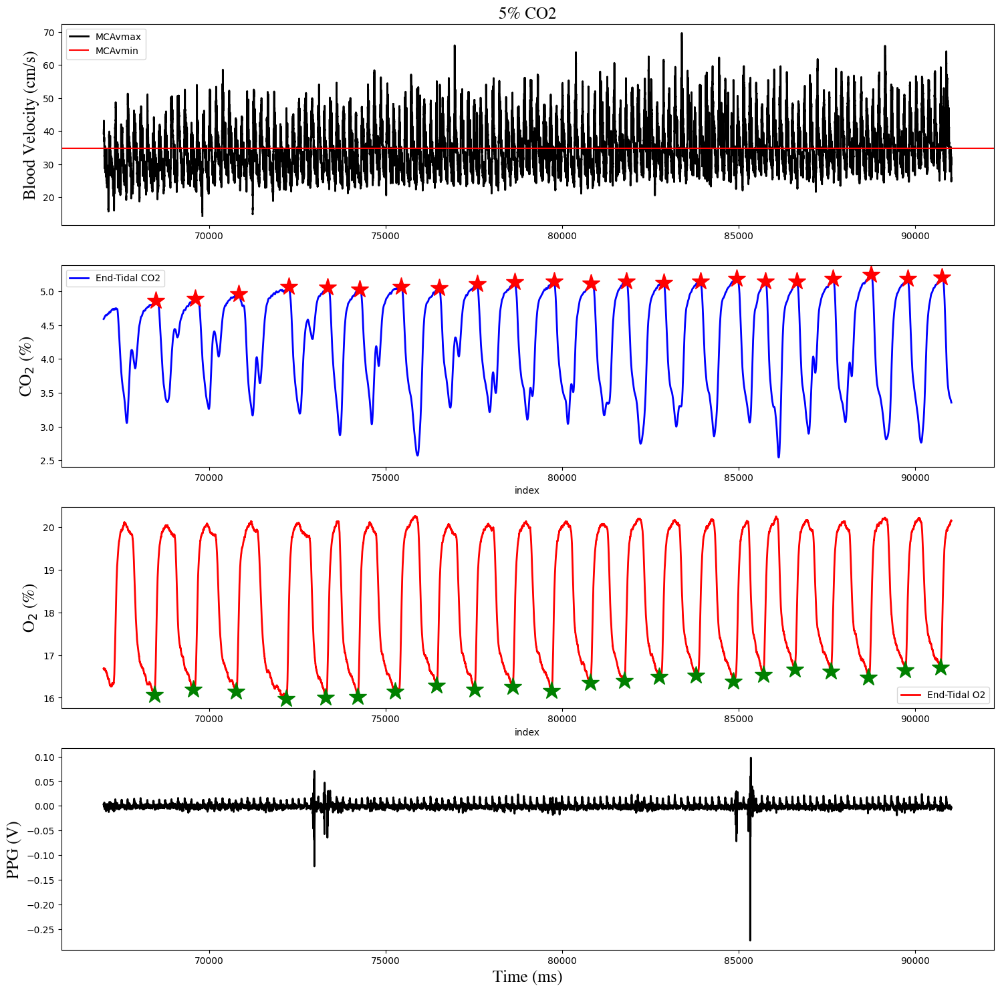

CVR: 2.3711999708433558 %/mmHg
CVR_SI: 47.09868098333721 %/mmHg
Percent CVR: 19.24925263889055 %/mmHg


In [25]:
# SUBJECT 14 #

filename = 'sub-014_ses-01_dat-20230518_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-015_ses-01_dat-20230516_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  185.45 s || 5% CO2:  189.4 s || Baseline 2:  115.15 s
-------After Cropping-------
Baseline 1:  119.99499999999999 s || 5% CO2:  119.99499999999995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 2.1818181818161975 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 27.877767415407646 mmHg
end tidal O2 mean: 124.25599905180263 mmHg
Stimulus index: 0.2243575169661252
MCAvmean mean_base: 33.705699322975704 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 37.745155831782625 mmHg
end tidal O2 mean: 126.20549743551173 mmHg
Stimulus index: 0.2990769546395519
MCAvmean mean_5CO2: 44.72971527208433 cm s-1
---------------------


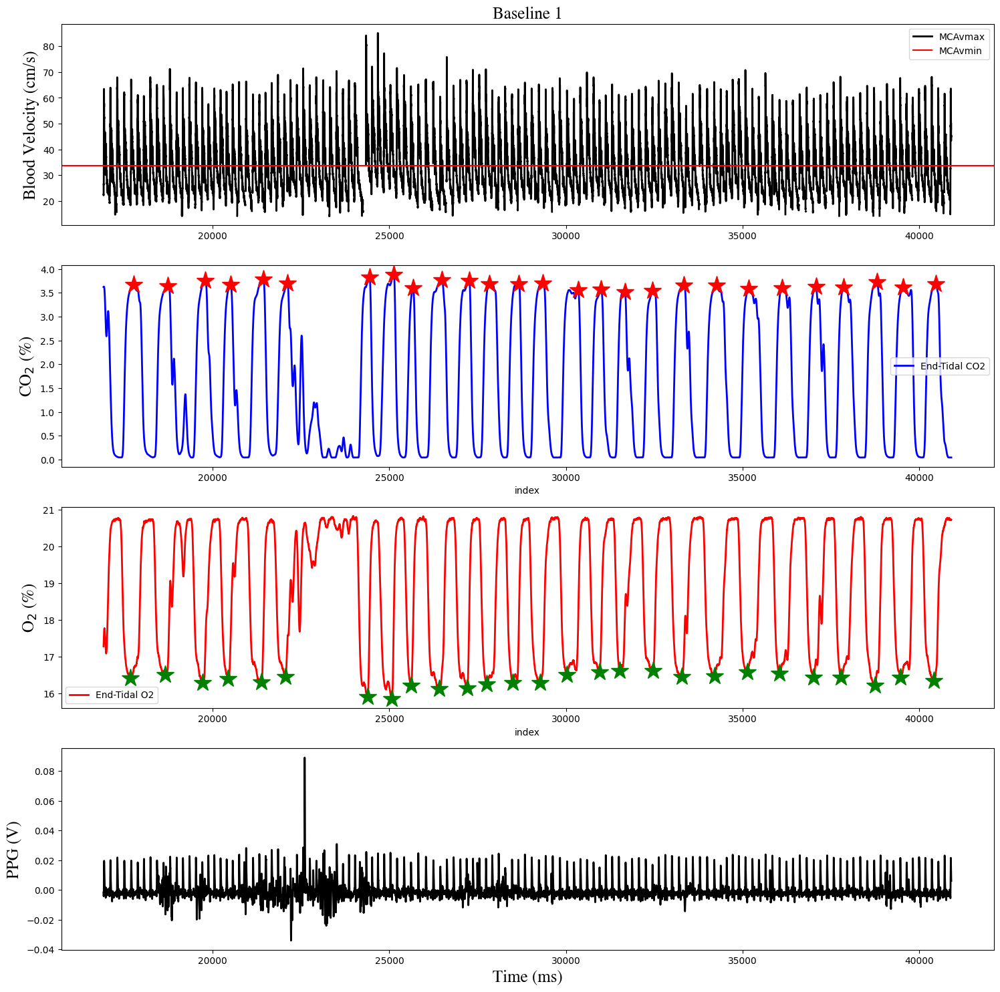

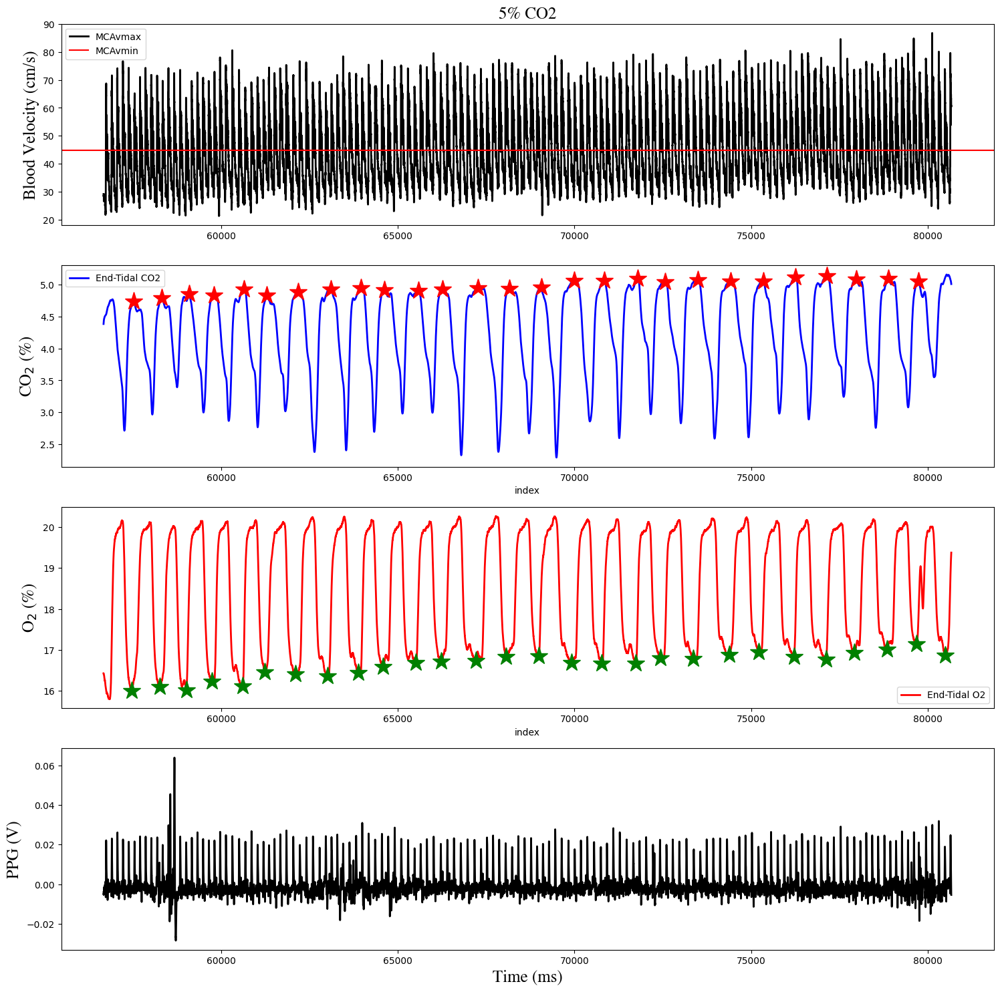

CVR: 3.3146239698924362 %/mmHg
CVR_SI: 57.65535424139429 %/mmHg
Percent CVR: 32.70668216515547 %/mmHg


In [26]:
# SUBJECT 15 #

filename = 'sub-015_ses-01_dat-20230516_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-016_ses-01_dat-20230523_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  182.9 s || 5% CO2:  207.85 s || Baseline 2:  120.95 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 2.8799999999973807 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 39.72384453630019 mmHg
end tidal O2 mean: 110.91940946234587 mmHg
Stimulus index: 0.35813249212966064
MCAvmean mean_base: 39.081758764273495 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 46.68353649433509 mmHg
end tidal O2 mean: 117.20016253533156 mmHg
Stimulus index: 0.3983231378221144
MCAvmean mean_5CO2: 45.731073370099786 cm s-1
---------------------


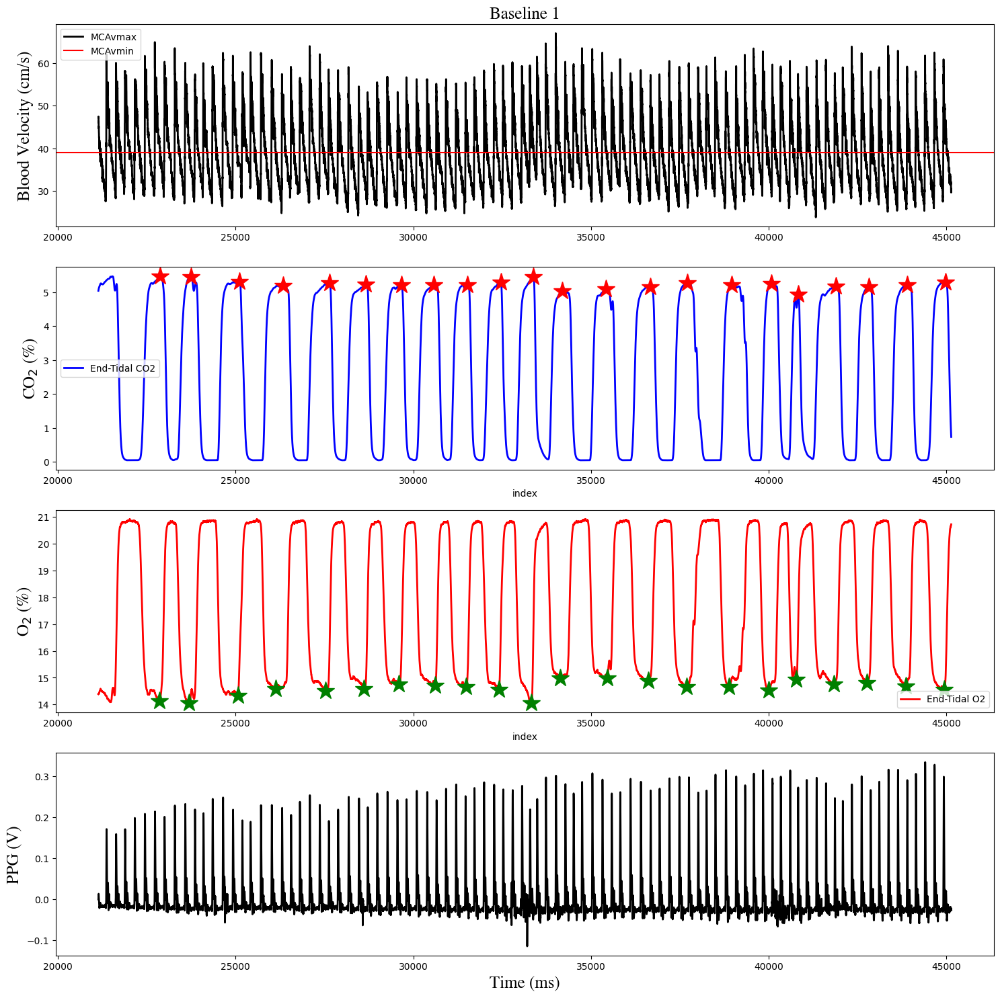

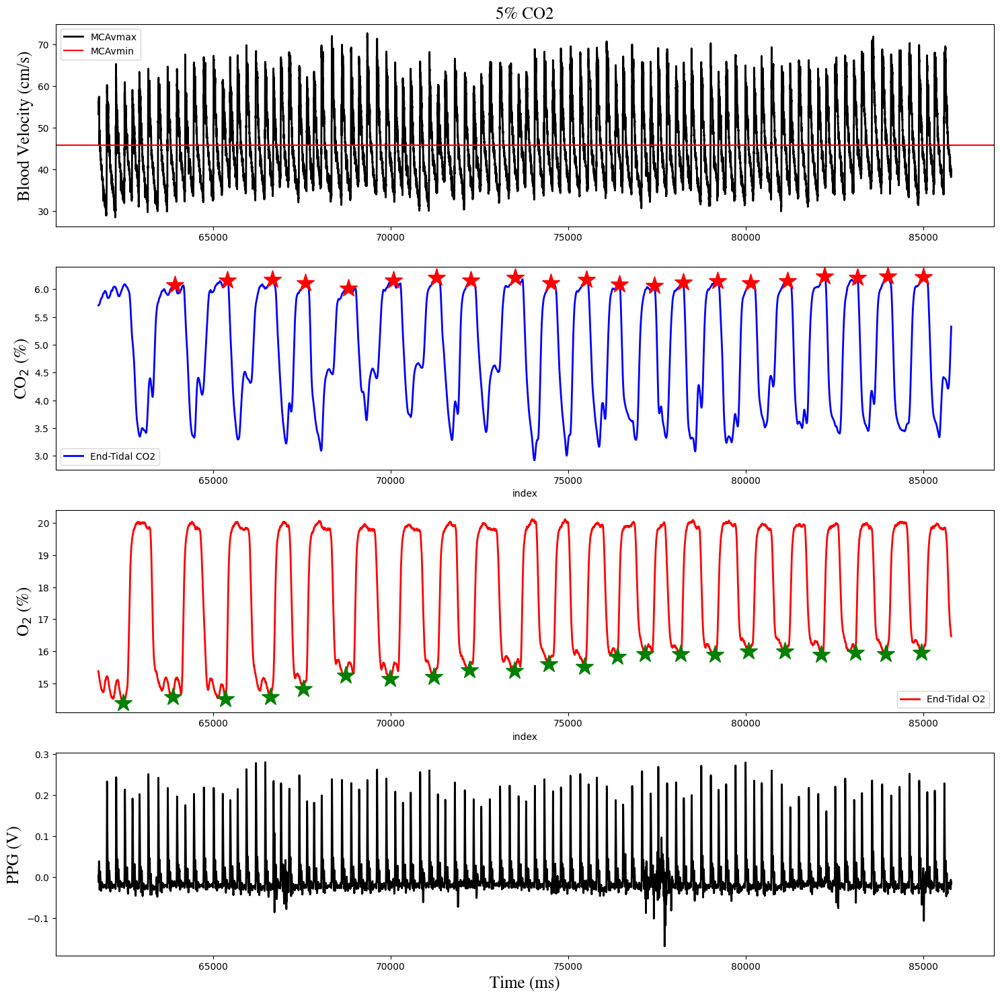

CVR: 2.444627901260936 %/mmHg
CVR_SI: 55.75894493532346 %/mmHg
Percent CVR: 17.013857144793462 %/mmHg


In [27]:
# SUBJECT 16 #

filename = 'sub-016_ses-01_dat-20230523_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 5
comment_end_baseline2 = 6

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-017_ses-01_dat-20230526_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  184.4 s || 5% CO2:  190.3 s || Baseline 2:  123.05 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 4.799999999995634 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 27.391634563462247 mmHg
end tidal O2 mean: 132.73440516315424 mmHg
Stimulus index: 0.20636423939816545
MCAvmean mean_base: 42.631560375234876 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 37.455544993819046 mmHg
end tidal O2 mean: 133.81537064383295 mmHg
Stimulus index: 0.27990465380477
MCAvmean mean_5CO2: 56.050371336542916 cm s-1
---------------------


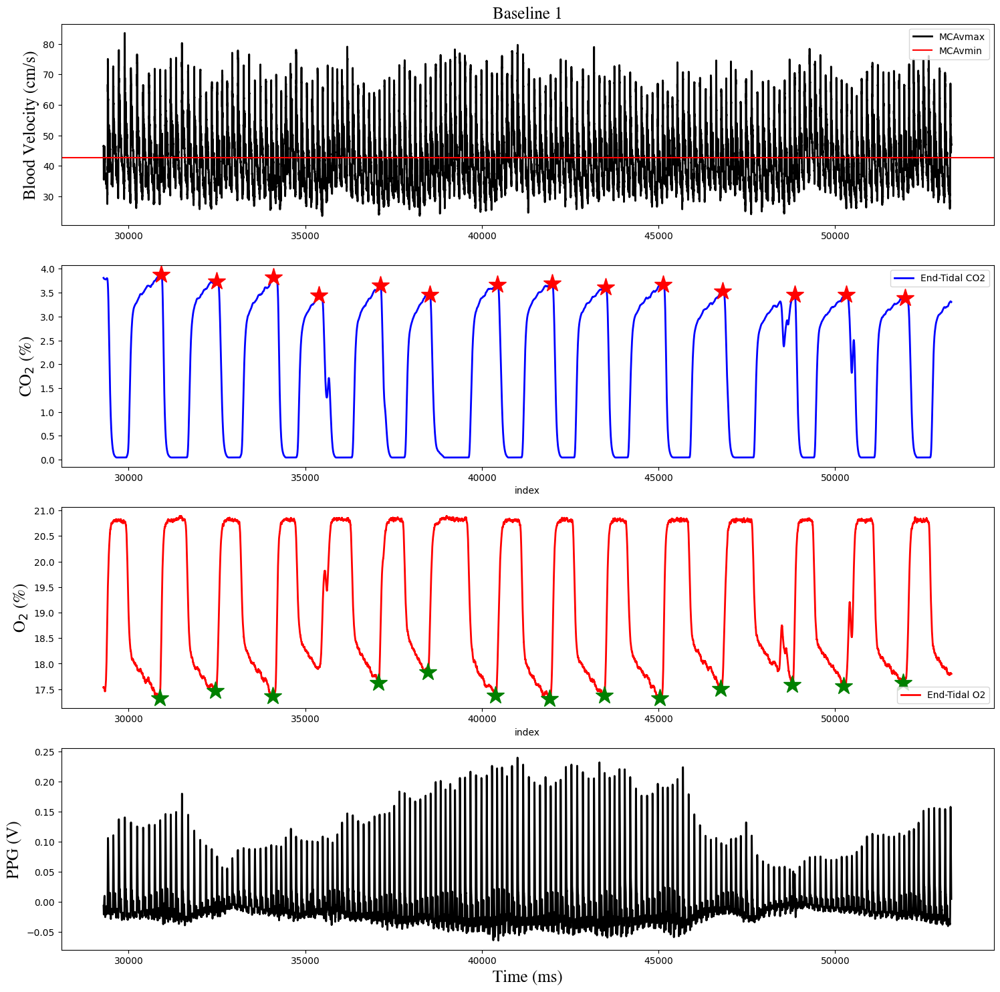

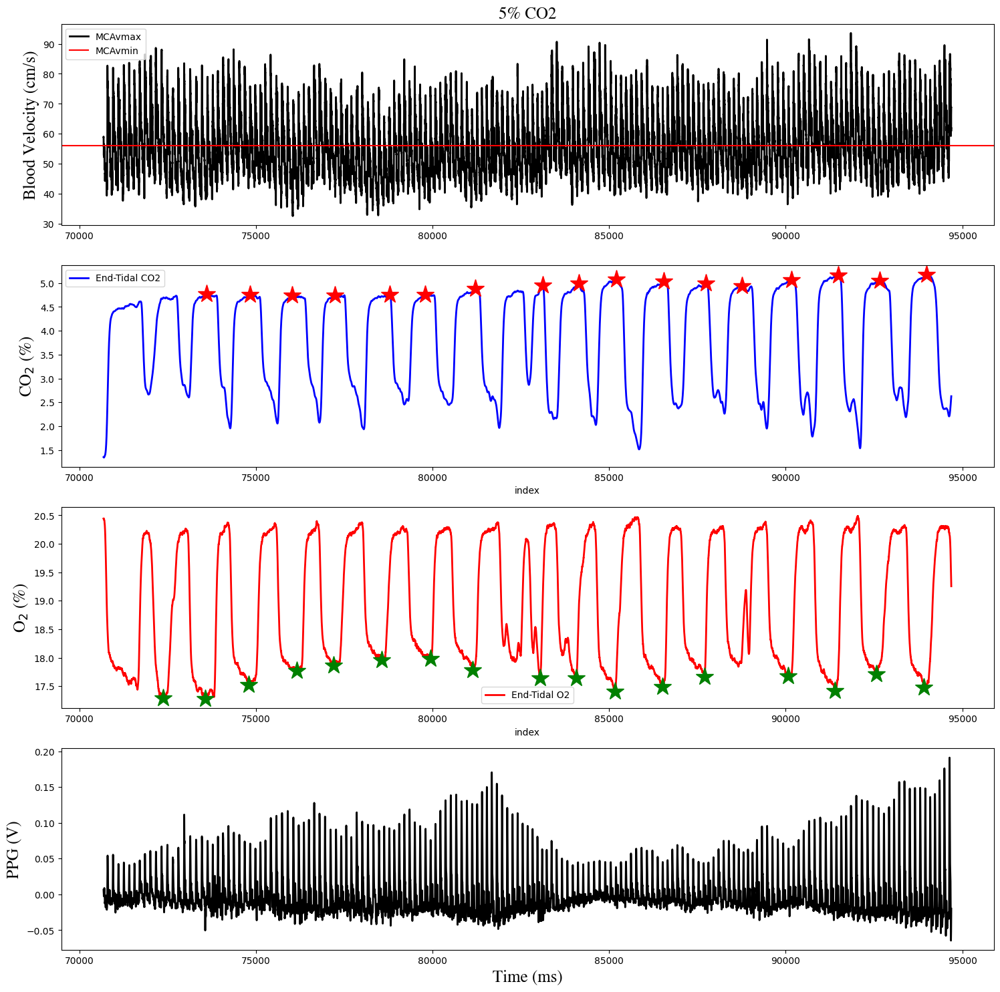

CVR: 3.1276348465920716 %/mmHg
CVR_SI: 56.37589923612078 %/mmHg
Percent CVR: 31.476236954965337 %/mmHg


In [28]:
# SUBJECT 17 #

filename = 'sub-017_ses-01_dat-20230526_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-018_ses-01_dat-20230526_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  187.6 s || 5% CO2:  182.95 s || Baseline 2:  122.1 s
-------After Cropping-------
Baseline 1:  119.99499999999999 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 1.9459459459441761 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 27.989688528336192 mmHg
end tidal O2 mean: 122.66145827882637 mmHg
Stimulus index: 0.22818649738136798
MCAvmean mean_base: 26.63587775193319 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 38.477177018567765 mmHg
end tidal O2 mean: 125.83825884078426 mmHg
Stimulus index: 0.30576692154689356
MCAvmean mean_5CO2: 34.49205854494633 cm s-1
---------------------


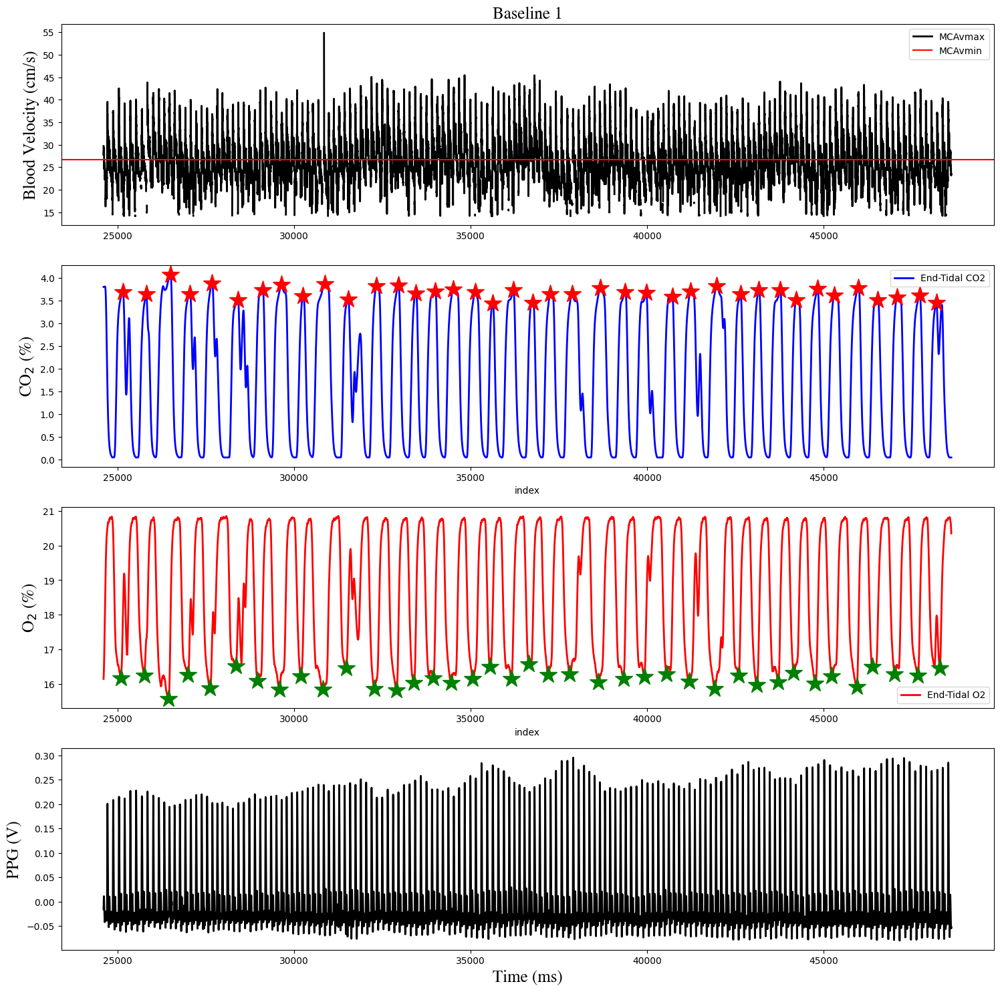

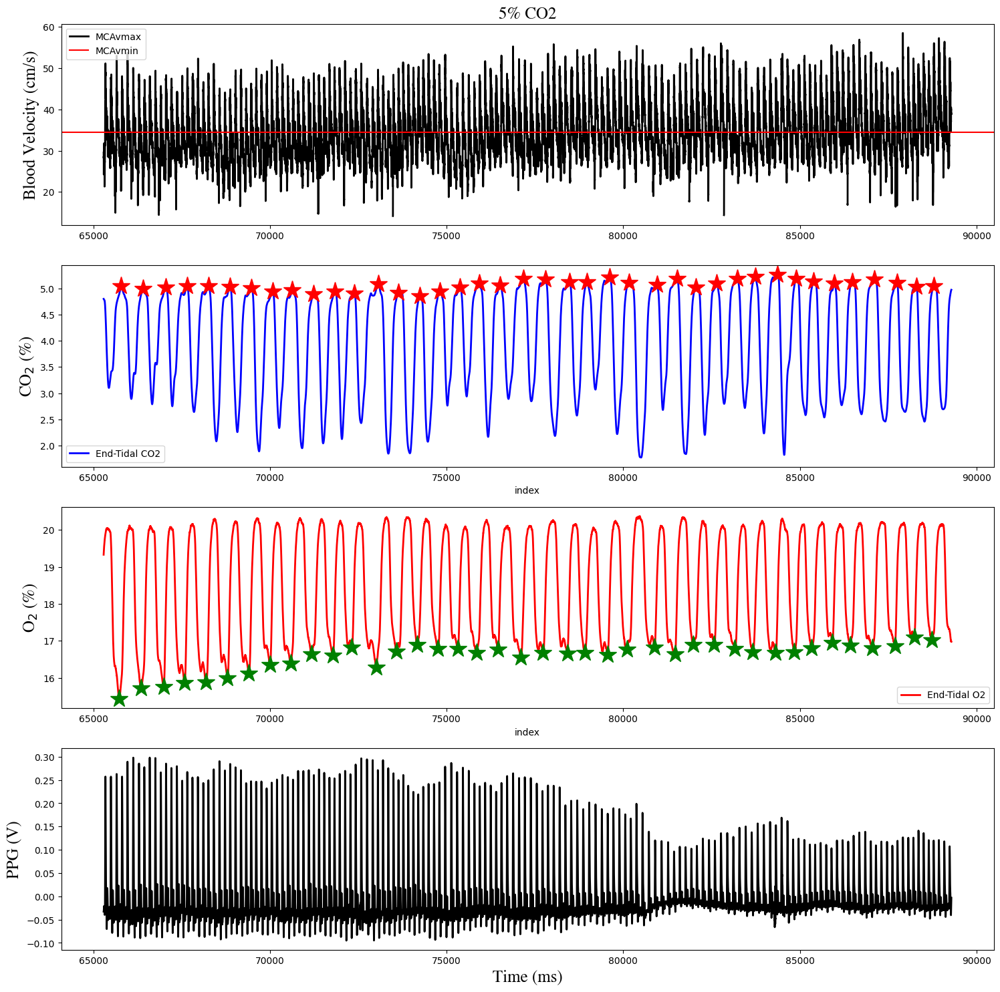

CVR: 2.81237325371026 %/mmHg
CVR_SI: 50.07593367518145 %/mmHg
Percent CVR: 29.494732128521473 %/mmHg


In [29]:
# SUBJECT 18 #

filename = 'sub-018_ses-01_dat-20230526_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')


sub-019_ses-01_dat-20230530_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  180.7 s || 5% CO2:  185.75 s || Baseline 2:  122.0 s
-------After Cropping-------
Baseline 1:  119.995 s || 5% CO2:  119.995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 1.636363636362148 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 37.878871962293125 mmHg
end tidal O2 mean: 109.0041238190532 mmHg
Stimulus index: 0.3474994397934158
MCAvmean mean_base: 46.443713471550076 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 46.19356240561236 mmHg
end tidal O2 mean: 117.20577173404256 mmHg
Stimulus index: 0.39412361458130635
MCAvmean mean_5CO2: 56.85472430984684 cm s-1
---------------------


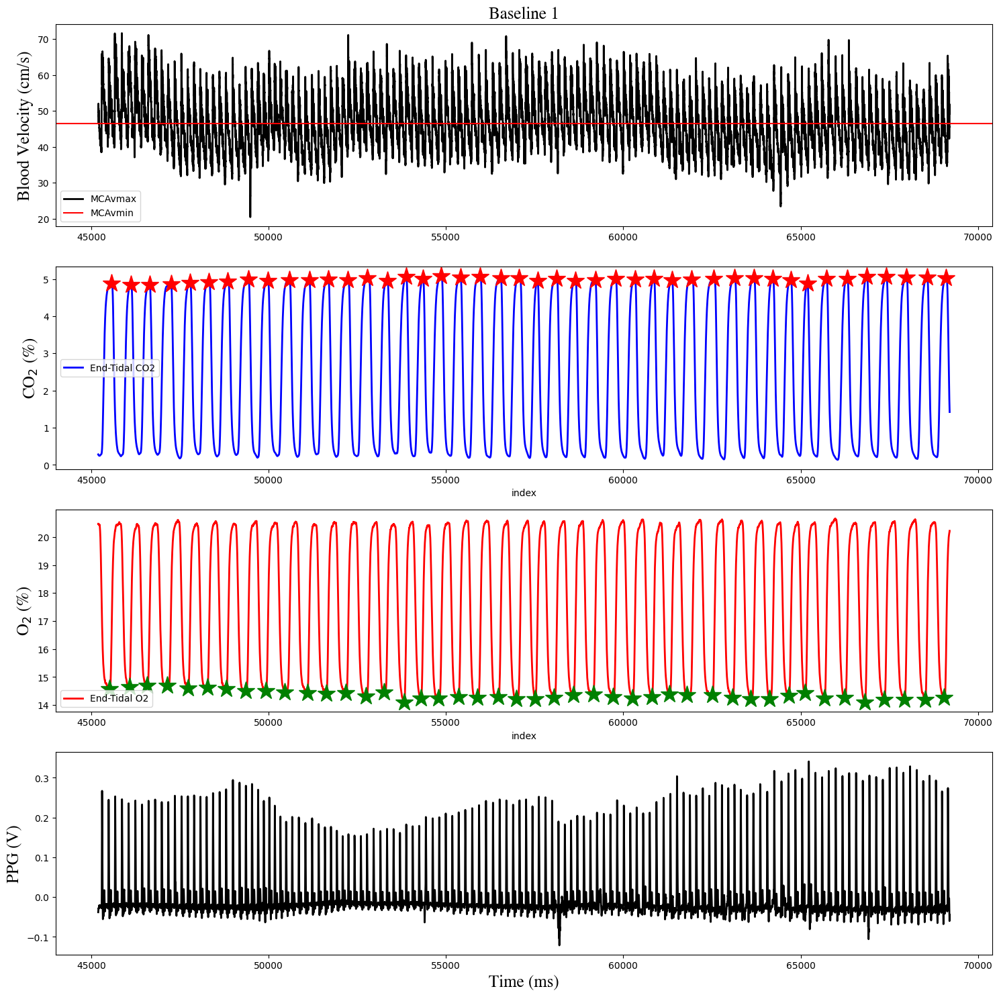

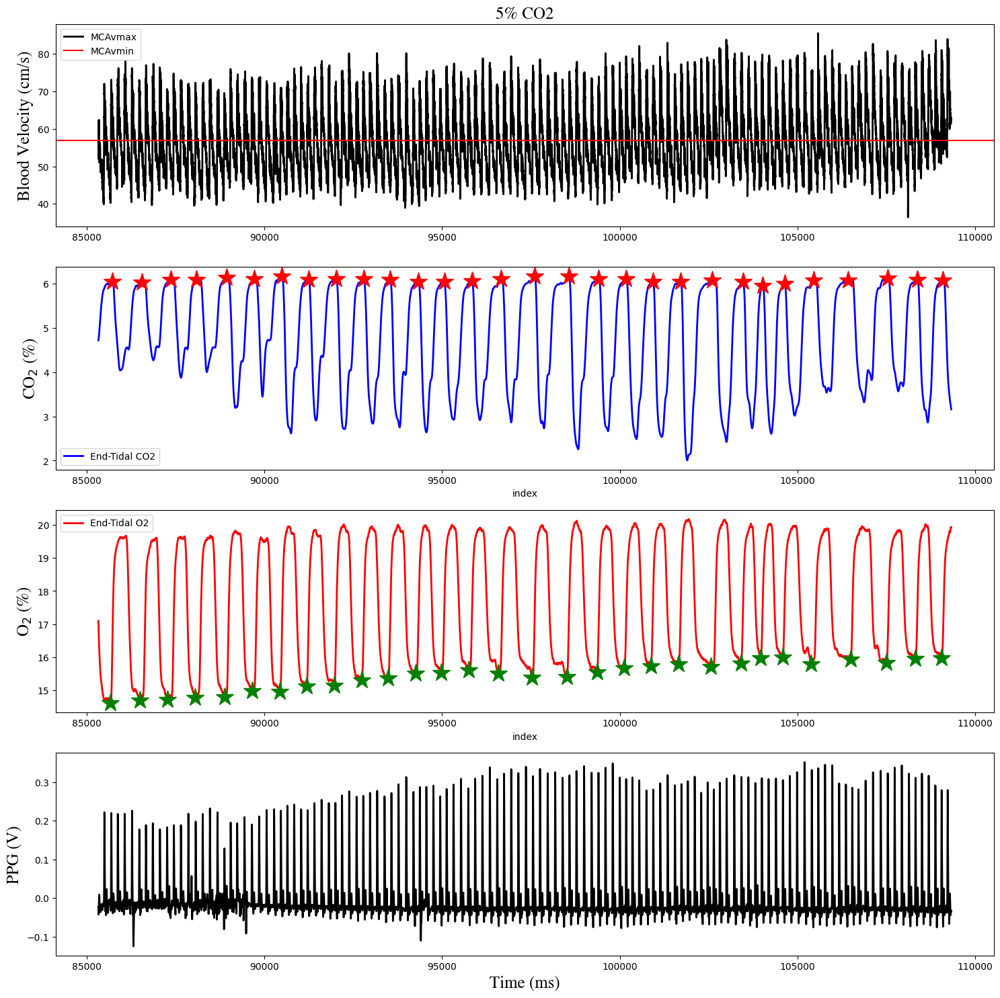

CVR: 2.6959999293972348 %/mmHg
CVR_SI: 63.32738462489491 %/mmHg
Percent CVR: 22.416404848148524 %/mmHg


In [30]:
# SUBJECT 19 #

filename = 'sub-019_ses-01_dat-20230530_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 0.5
O2prominence_5co2 = 1
comment_start_baseline1 = 1
comment_end_baseline1 = 2
comment_start_5co2 = 3
comment_end_5co2 = 4
comment_start_baseline2 = 5
comment_end_baseline2 = 6

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')



sub-020_ses-01_dat-20230531_task-tcd5co2_pwl.txt
---------------------
Baseline 1:  183.15 s || 5% CO2:  183.4 s || Baseline 2:  122.75 s
-------After Cropping-------
Baseline 1:  119.99499999999999 s || 5% CO2:  119.99499999999995 s || Baseline 2:  69.995 s
Sample rate: 200.0000000001819 Hz || Search window: 2.322580645159178 seconds
---------------------
--- BASELINE DATA ---
end tidal CO2 mean: 31.838675614223526 mmHg
end tidal O2 mean: 115.86924169992804 mmHg
Stimulus index: 0.27478108208110674
MCAvmean mean_base: 22.566006551139978 cm s-1
--- 5% CO2 DATA ---
end tidal CO2 mean: 42.444022960755724 mmHg
end tidal O2 mean: 121.67837565018317 mmHg
Stimulus index: 0.34882141328693705
MCAvmean mean_5CO2: 23.573855878796685 cm s-1
---------------------


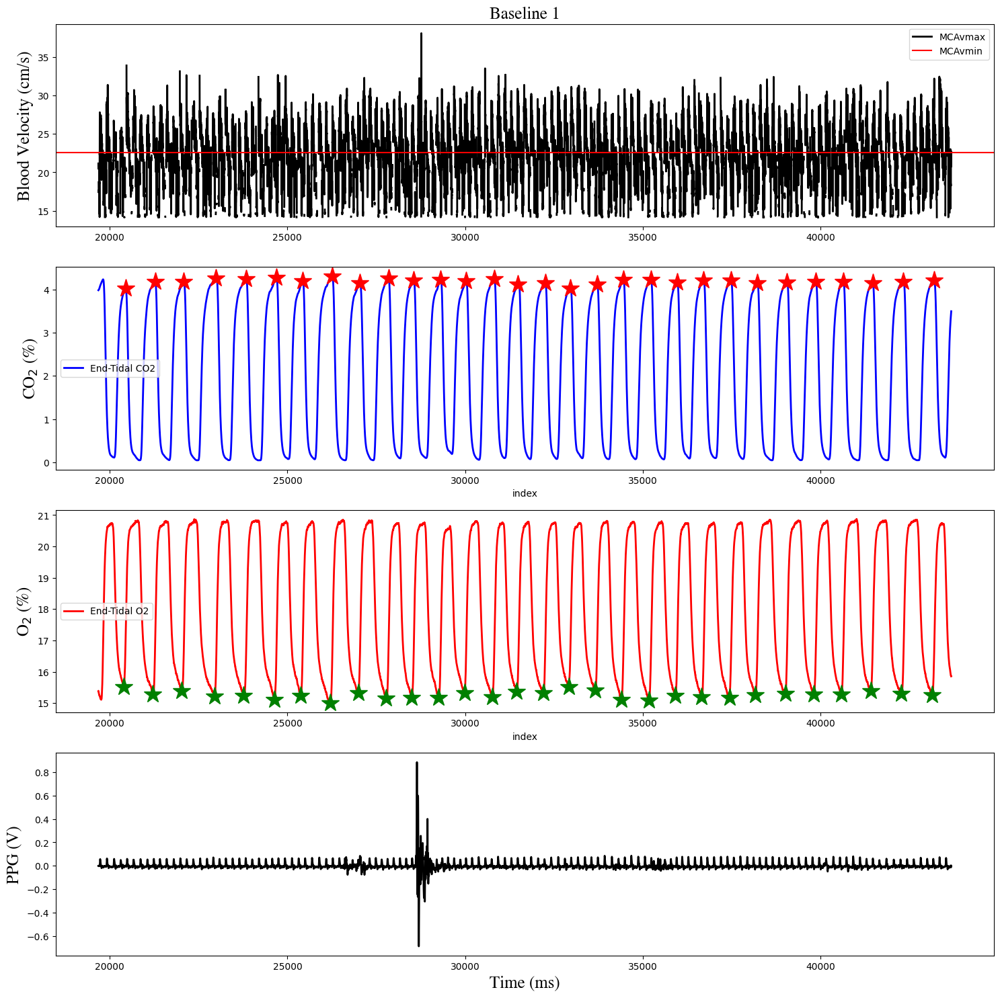

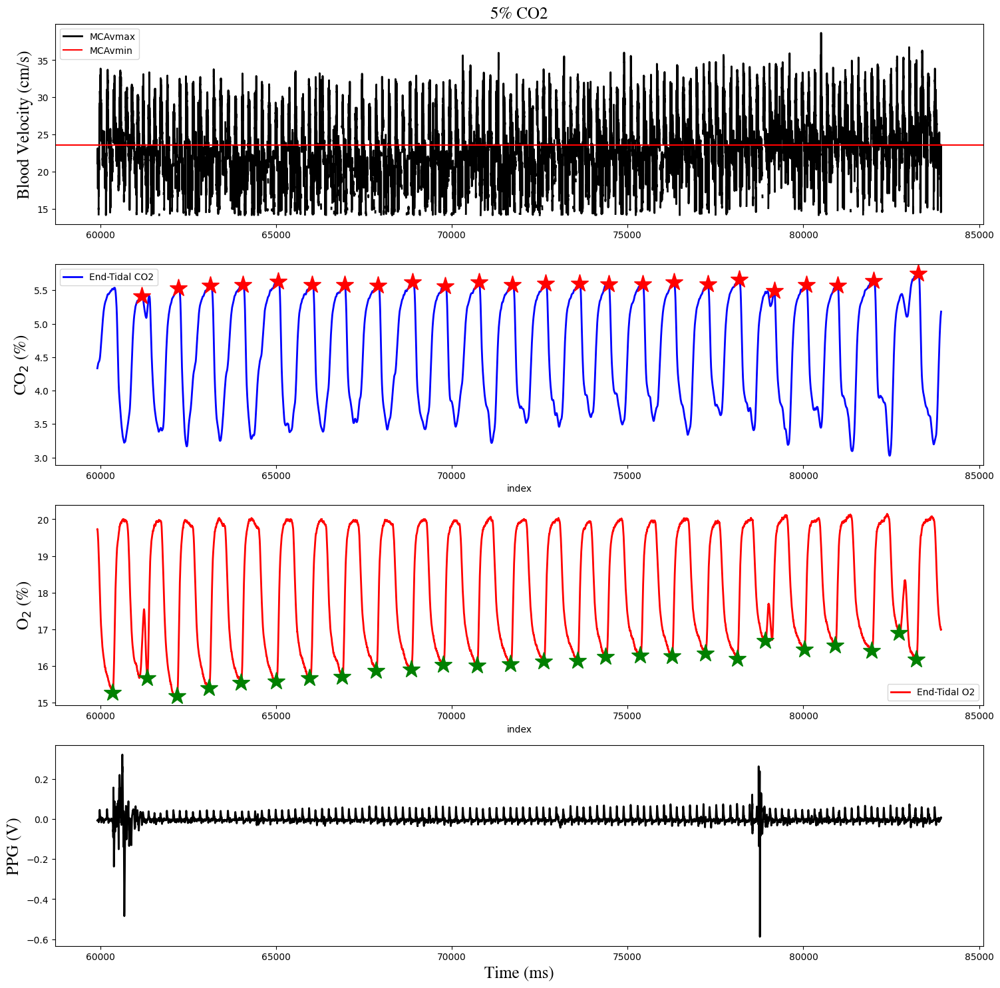

CVR: 0.42112982847470076 %/mmHg
CVR_SI: 7.945281645479661 %/mmHg
Percent CVR: 4.4662281089597275 %/mmHg


In [31]:
# SUBJECT 20 #

filename = 'sub-020_ses-01_dat-20230531_task-tcd5co2_pwl.txt'
filepath = data_dir + filename
CO2prominence_base = 3
O2prominence_base = 3
CO2prominence_5co2 = 1.7
O2prominence_5co2 = 1
comment_start_baseline1 = 0
comment_end_baseline1 = 1
comment_start_5co2 = 2
comment_end_5co2 = 3
comment_start_baseline2 = 4
comment_end_baseline2 = 5

print(filename)
percent_CVR, CVR, CVR_SI = cvr_func.get_cvr(filepath, plotting, save_fig, save_csv, csv_ses01, save_log, log_ses01, comment_start_baseline1, comment_end_baseline1, comment_start_5co2, comment_end_5co2, comment_start_baseline2, comment_end_baseline2, TCD_calibration_factor, TCD_threshold, CO2prominence_base, O2prominence_base, CO2prominence_5co2, O2prominence_5co2, P_conversion_perc2mmHg, window_length_baseline1, window_length_5co2, window_length_baseline2)
print('CVR: ' + str(CVR) + ' %/mmHg')
print('CVR_SI: ' + str(CVR_SI) + ' %/mmHg')
print('Percent CVR: ' + str(percent_CVR) + ' %/mmHg')

In [32]:
# Reorder the results and log csv file by subject ID
cvr_func.reorder_csv_by_subj('pwl_outputs/cvr_ses-01.csv')
cvr_func.reorder_csv_by_subj('pwl_outputs/logs_ses-01.csv')

cvr_func.reorder_csv_by_subj('pwl_outputs/cvr_ses-02.csv')
cvr_func.reorder_csv_by_subj('pwl_outputs/logs_ses-02.csv')

In [33]:
# Create cvr and log consolidated csv from session csv files
cvr_func.create_consolidated_csv('pwl_outputs/cvr_ses-01.csv', 'pwl_outputs/cvr_ses-02.csv', csv_consolidated)
cvr_func.create_consolidated_csv('pwl_outputs/logs_ses-01.csv', 'pwl_outputs/logs_ses-02.csv', log_consolidated)
